# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

In [175]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload
from time import sleep
# Third-Party Library Imports
import numpy as np
import pandas as pd
import xarray as xr
import climtas

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
from functools import partial
from glob import glob
import cftime
import string
from numpy.typing import ArrayLike
# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
# import signal_to_noise as sn
import plotting_functions
import xarray_extender as xe
import zec_calculation_functions
import signal_to_noise_calculations as sn_calc

# import drift_functions
import sn_plotting
import my_stats
# import signal_to_noise_calculations as sn_calc

# import sn_plotting_utils
# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning, module='dask.*')
warnings.filterwarnings("ignore", category=Warning)
# # Logging
# logger = utils.get_notebook_logger()

In [72]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
from listXarray import listXarray

In [73]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [74]:
# client.close()

In [111]:
from dask.distributed import Client
client = Client(memory_limit=None, threads_per_worker=1, n_workers=12)
client

- State start
- Found stale lock file and directory '/jobfs/122053882.gadi-pbs/dask-scratch-space/scheduler-dp0nqoai', purging
-   Scheduler at:     tcp://127.0.0.1:38443
-   dashboard at:         /proxy/8787/status
- Registering Worker plugin shuffle
-         Start Nanny at: 'tcp://127.0.0.1:42665'
-         Start Nanny at: 'tcp://127.0.0.1:46273'
-         Start Nanny at: 'tcp://127.0.0.1:40255'
-         Start Nanny at: 'tcp://127.0.0.1:34381'
-         Start Nanny at: 'tcp://127.0.0.1:46157'
-         Start Nanny at: 'tcp://127.0.0.1:36439'
-         Start Nanny at: 'tcp://127.0.0.1:37391'
-         Start Nanny at: 'tcp://127.0.0.1:36327'
-         Start Nanny at: 'tcp://127.0.0.1:35857'
-         Start Nanny at: 'tcp://127.0.0.1:37219'
-         Start Nanny at: 'tcp://127.0.0.1:33481'
-         Start Nanny at: 'tcp://127.0.0.1:37905'
- Register worker <WorkerState 'tcp://127.0.0.1:35159', name: 1, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 12
Total threads: 12,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38443,Workers: 12
Dashboard: /proxy/8787/status,Total threads: 12
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:38429,Total threads: 1
Dashboard: /proxy/34497/status,Memory: 0 B
Nanny: tcp://127.0.0.1:42665,


# Opening Data

In [76]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [77]:
a1_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('1000pgc', 'tas', chunks=chunks, logginglevel='ERROR')
                 .to_dataarray('tas')
                 .sort_by_refkey())

In [78]:
pct_raw_xrlist =  (open_zecmip.extract_experiment_into_xrlist('1pct', 'tas', chunks=chunks)
                   .to_dataarray('tas')
                   .sort_by_refkey())

In [79]:
# pi-Control (not ESM)
esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [80]:
### ESM-pi-Control
# esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('esm-piControl', 'tas', logginglevel='INFO') #esm-piControl'
#                     .to_dataarray('tas')
#                     # .isel(ensemble=0)
#                     # .squeeze('ensemble')
#                     .sort_by_refkey()
#                     .rename({'latitude':'lat', 'longitude': 'lon'}))

In [81]:
esmpi_raw_xrlist

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5 ({'model': 1, 'time': 12000, 'lat': 145, 'lon': 192})
CESM2         ({'model': 1, 'time': 14400, 'lat': 192, 'lon': 288})
CanESM5       ({'model': 1, 'time': 16800, 'lat': 64, 'lon': 128})
GFDL-ESM4     ({'model': 1, 'time': 6000, 'lat': 180, 'lon': 288})
GISS-E2-1-G-CC({'model': 1, 'time': 1980, 'lat': 90, 'lon': 144})
MIROC-ES2L    ({'model': 1, 'time': 6000, 'lat': 64, 'lon': 128})
MPI-ESM1-2-LR ({'model': 1, 'time': 12000, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 6012, 'lat': 96, 'lon': 144})
UKESM1-0-LL   ({'model': 1, 'time': 22560, 'lat': 144, 'lon': 192})

In [82]:
# Making sure that the ensembles match. NOTE -  this can not be done
# with the piControl
a1_raw_xrlist = a1_raw_xrlist.cross_match_dim(pct_raw_xrlist, 'ensemble')
pct_raw_xrlist = pct_raw_xrlist.cross_match_dim(a1_raw_xrlist, 'ensemble')

In [83]:
# We are just looking at a single ensemble here.
a1_raw_xrlist = a1_raw_xrlist.isel(ensemble=0)
pct_raw_xrlist = pct_raw_xrlist.isel(ensemble=0)
esmpi_raw_xrlist = esmpi_raw_xrlist.isel(ensemble=0)

In [84]:
mask_ds = xr.open_dataset(os.path.join(constants.ZECMIP_LOCAL_DIR, 'landsea_mask_regridd_MPI_ESM.nc')); mask_ds

<xarray.Dataset> Size: 150kB
Dimensions:  (lat: 96, lon: 192)
Coordinates:
    model    <U13 52B ...
    window   int64 8B ...
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.3 358.1
Data variables:
    mask     (lat, lon) int64 147kB ...

In [85]:
# mask_ds = xr.open_dataset(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'landsea_mask_regridd_MPI_ESM.nc')); mask_ds

In [86]:
# Convert to celcius
a1_raw_xrlist = a1_raw_xrlist - 273.15
pct_raw_xrlist = pct_raw_xrlist - 273.15
esmpi_raw_xrlist = esmpi_raw_xrlist - 273.15

In [87]:
# Can remove a lot of data, as I don't actually need this past the 70 year mark
# Data is montly so times by 12, a do 100 points just for saftery
pct_raw_xrlist = pct_raw_xrlist.isel(time=slice(0, 100 * 12))

In [88]:
# Yearly data transfomration - montly resolution is not needed
esmpi_xrlist = esmpi_raw_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
pct_xrlist = pct_raw_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
a1_xrlist = a1_raw_xrlist.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')

# Can see this in the global mean time series. But this has errors after 1000
esmpi_xrlist['CanESM5'] = esmpi_xrlist['CanESM5'].isel(time=slice(None, 1000))

In [89]:
# Reduce time so that the smalles time densions matches. This is at 101 years
a1_xrlist = a1_xrlist.isel(time=slice(None, 100))

In [90]:
def regrid_with_climtas(ds, target_ds):
        regridder = climtas.regrid.Regridder(ds, target_ds)
        regridded_ds = regridder.regrid(ds).compute()
    
        # Sometimes the re-gridd will remove the coordinates from the array
        coord_dict = dict(lat=regridded_ds.lat.values, lon=regridded_ds.lon.values)

        regridded_ds=regridded_ds.assign_coords(coord_dict)
        return regridded_ds

In [91]:
def regrid_listxarray(lxr, target_model):
    regridd_list = []
    for model in range(len(lxr)):
        print(f'{model}, ', end='')
        # regridder = climtas.regrid.Regridder(lxr[model] , lxr[target_model])
        # regridded_ds = regridder.regrid(lxr[model] ).compute()
        # # Sometimes the re-gridd will remove the coordinates from the array
        # # if list(regridded_ds.indexes)
        # coord_dict = dict(lat=regridded_ds.lat.values, lon=regridded_ds.lon.values)

        # regridded_ds=regridded_ds.assign_coords(coord_dict)
        regridded_ds = regrid_with_climtas(lxr[model] , lxr[target_model])
        regridd_list.append(regridded_ds)
    lxr_regridded = listXarray(regridd_list, 'model')
    return lxr_regridded

In [92]:
%%time
esmpi_xrlist = regrid_listxarray(esmpi_xrlist, 'MPI-ESM1-2-LR')

0, 1, 2, 3, 4, 5, 6, 7, 8, CPU times: user 3min 7s, sys: 31.3 s, total: 3min 38s
Wall time: 3min 25s


In [93]:
%%time
a1_xrlist = regrid_listxarray(a1_xrlist, 'MPI-ESM1-2-LR')

0, 1, 2, 3, 4, 5, 6, 7, 8, CPU times: user 31.2 s, sys: 6.41 s, total: 37.6 s
Wall time: 35.8 s


In [94]:
%%time
pct_xrlist = regrid_listxarray(pct_xrlist, 'MPI-ESM1-2-LR')

0, 1, 2, 3, 4, 5, 6, 7, 8, CPU times: user 19.4 s, sys: 3.53 s, total: 22.9 s
Wall time: 23.5 s


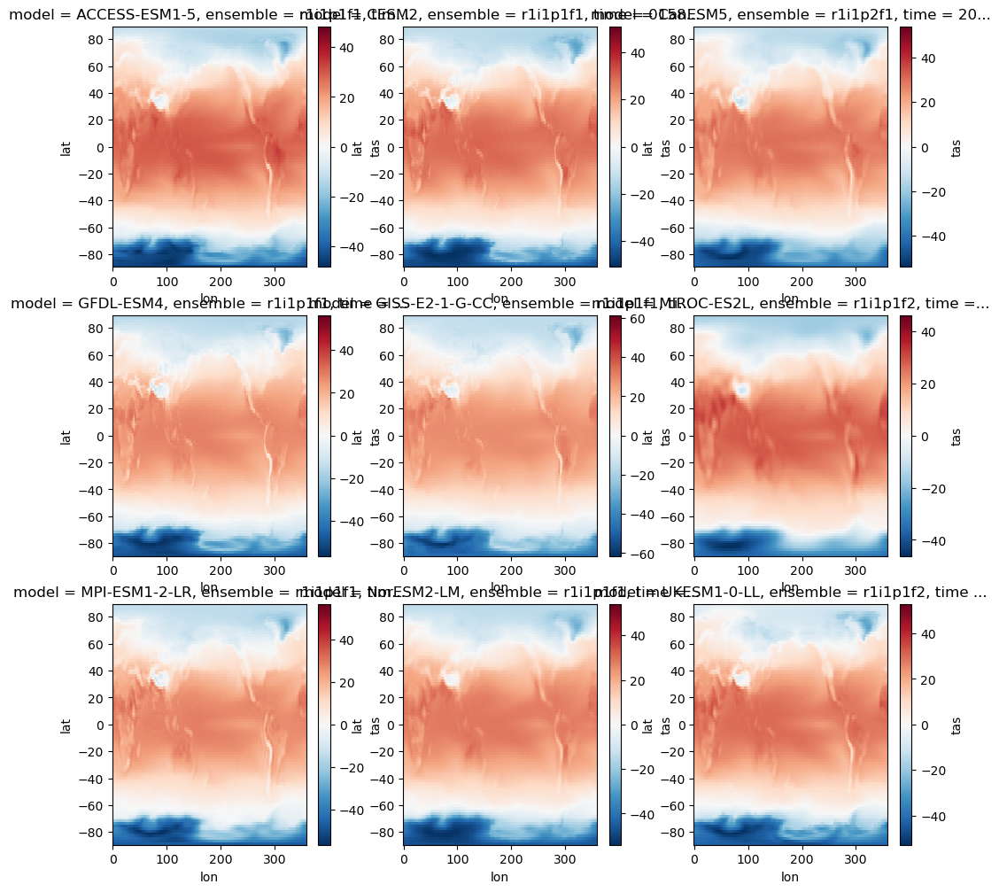

In [95]:
models = a1_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    a1_xrlist[model].isel(time=-10).plot(ax=ax)

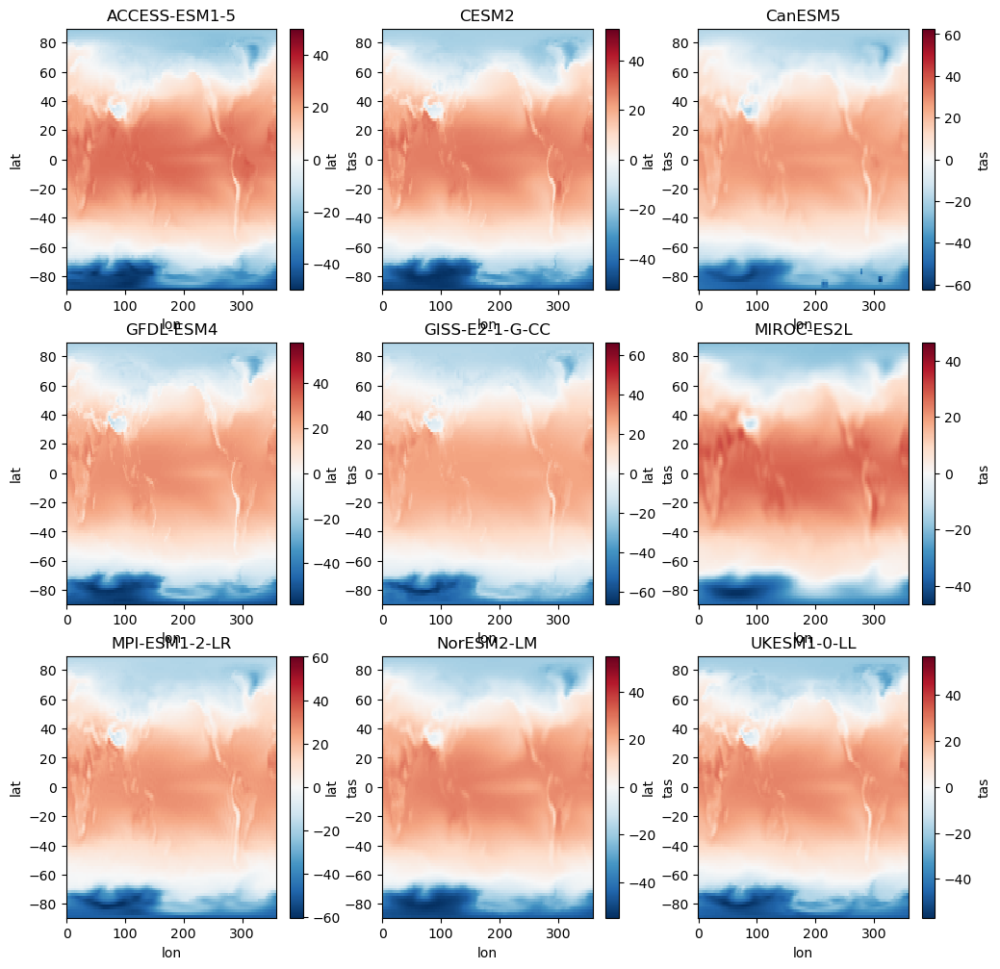

In [96]:
models = a1_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    esmpi_xrlist[model].isel(time=100).plot(ax=ax)
    ax.set_title(model)


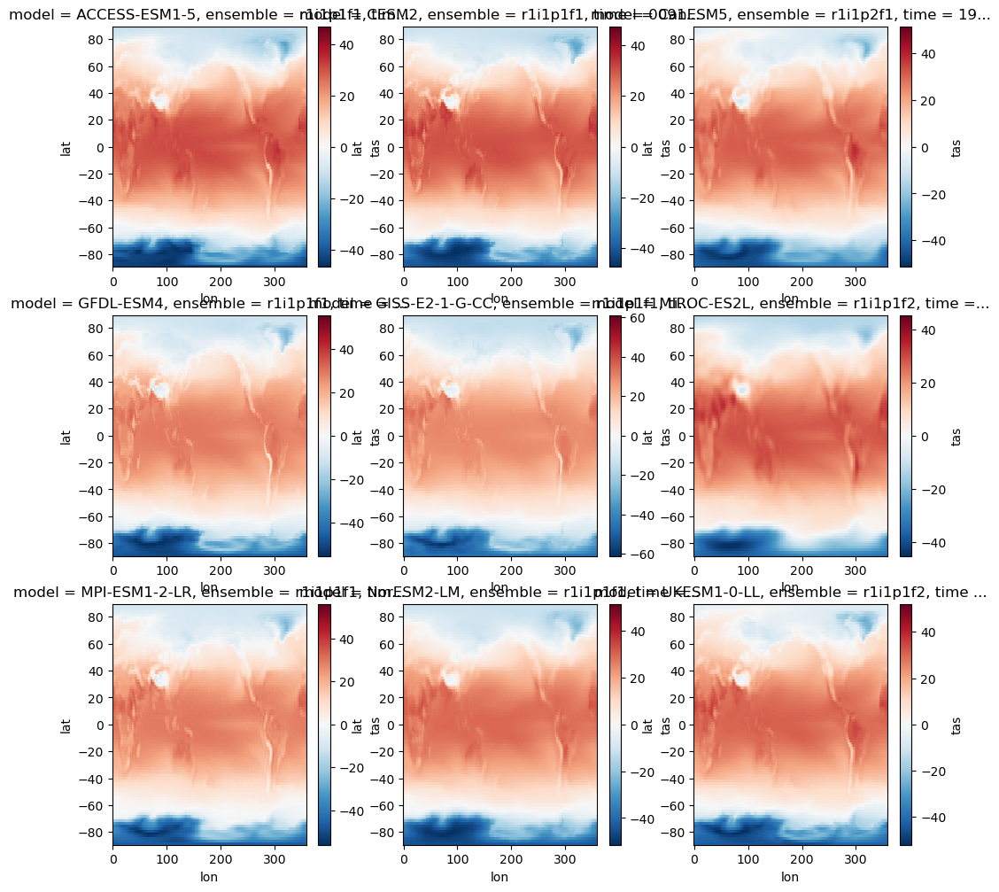

In [97]:
models = a1_xrlist.refkeys
ncols = 3
nrows = int(len(models)/ncols)
fig = plt.figure(figsize=(12, 12))
axes = [fig.add_subplot(nrows, ncols, i+1) for i in range(ncols*nrows)]

for num, model in enumerate(models):
    ax = axes[num]
    pct_xrlist[model].isel(time=-10).plot(ax=ax)

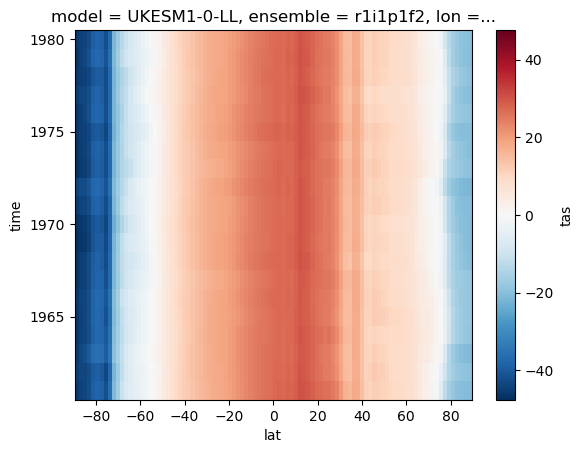

In [98]:
esmpi_xrlist[8].isel(lon=0).isel(time=slice(0,20)).squeeze().plot();

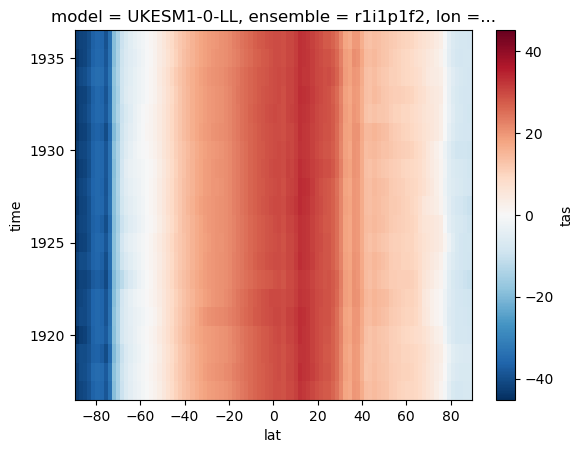

In [99]:
a1_xrlist['UKESM1-0-LL'].isel(lon=0).isel(time=slice(0,20)).squeeze().plot();

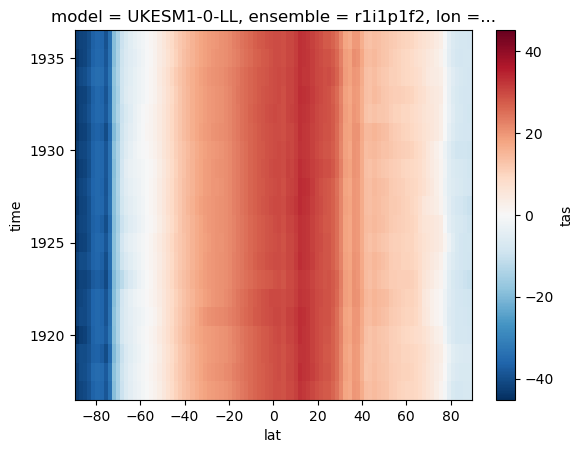

In [100]:
a1_xrlist['UKESM1-0-LL'].isel(lon=0).isel(time=slice(0,20)).squeeze().plot();

In [101]:
# Base period calculation - 20 year average at branch poin
branch_point_mean_xrlist = listXarray([zec_calculation_functions.calculate_branch_average(
    pct_xrlist[model], a1_xrlist[model], logginglevel='INFO') for model in pct_xrlist.refkeys]).set_refkeys('model')

- ['ACCESS-ESM1-5'] - ['ACCESS-ESM1-5']
- branch_start_time=cftime.DatetimeProlepticGregorian(168, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CESM2'] - ['CESM2']
- branch_start_time=cftime.DatetimeNoLeap(68, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CanESM5'] - ['CanESM5']
- branch_start_time=cftime.DatetimeNoLeap(1911, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=61
- 

- ['GFDL-ESM4'] - ['GFDL-ESM4']
- branch_start_time=cftime.DatetimeNoLeap(64, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=63
- 

- ['GISS-E2-1-G-CC'] - ['GISS-E2-1-G-CC']
- branch_start_time=cftime.DatetimeNoLeap(1920, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=70
- 

- ['MIROC-ES2L'] - ['MIROC-ES2L']
- branch_start_time=cftime.DatetimeGregorian(1913, 12, 31, 0, 0, 0, 0, has_year_zero=False)
- onepct_branch_arg=63
- 

- ['MPI-ESM1-2-LR'] - ['MPI-ESM1-2-LR']
- branch_start_time=cftime.DatetimeProlepticGregorian(1915,

In [102]:
# Amomaly time series from the branch point (previosuly called 'experiment_zec_da_anom')
a1_anom_xrlist = (a1_xrlist - branch_point_mean_xrlist)#.compute()

In [103]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_xrlist = a1_anom_xrlist.isel(time=slice(15, 35)).mean(dim='time')
zec50_xrlist = a1_anom_xrlist.isel(time=slice(40, 60)).mean(dim='time')
zec50_xrlist

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5 ({'model': 1, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'lat': 96, 'lon': 192})
MPI-ESM1-2-LR ({'model': 1, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'lat': 96, 'lon': 192})

In [104]:
np.take(esmpi_xrlist.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

array([cftime.DatetimeNoLeap(5201, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(5202, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(5203, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6198, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6199, 12, 31, 0, 0, 0, 0, has_year_zero=True),
       cftime.DatetimeNoLeap(6200, 12, 31, 0, 0, 0, 0, has_year_zero=True)],
      dtype=object)

In [105]:
# Reset to time zero
a1_anom_xrlist = a1_anom_xrlist.apply(utils.reset_time_to_0_start)
pct_xrlist = pct_xrlist.apply(utils.reset_time_to_0_start)
esmpi_xrlist = esmpi_xrlist.apply(utils.reset_time_to_0_start)

In [106]:
np.take(esmpi_xrlist.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

array([cftime.datetime(1, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(2, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(3, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(998, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(999, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       cftime.datetime(1000, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False)],
      dtype=object)

In [107]:
# These two can be computed as they are small (combined is around  100mb with each 
# model being around 7mb
a1_anom_xrlist = a1_anom_xrlist.compute()
pct_xrlist = pct_xrlist.compute()

In [108]:
# Each model is around 100mb. Parallel across this would be great. But would be 
# too much effort for now
esmpi_xrlist = esmpi_xrlist.compute()

# SN Calculation

In [109]:
# NOTE: This can only be done if all the time lengths are the same
# If they are different then PLEASE use listxarray
# Converted to xarray - all models now have matching coordinates

a1_anom_ds = a1_anom_xrlist.drop('ensemble').concat('model').sortby('model').compute()
esmpi_ds = esmpi_xrlist.drop('ensemble').concat('model').sortby('model').compute()
# a1_anom_detrend_ds = a1_anom_detrend_xrlist.concat('model').sortby('model').compute()
# pct_ds = pct_xrlist.concat('model').sortby('model')

In [112]:
a1_anom_trend_ds = my_stats.trend_fit(a1_anom_ds, method='polynomial', order=4)
a1_anom_detrend_ds = a1_anom_ds - a1_anom_trend_ds

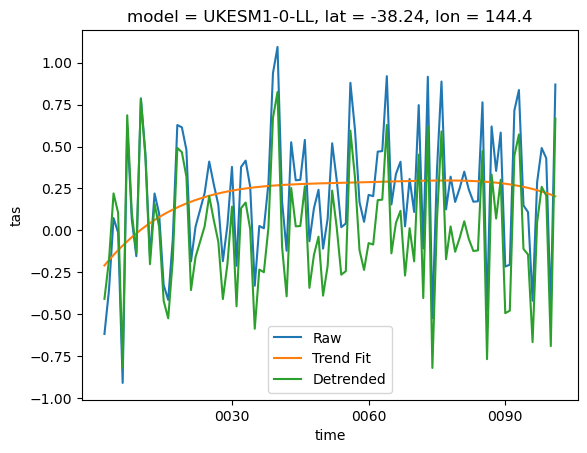

In [113]:
model = 'UKESM1-0-LL'#'CESM2'
a1_anom_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Raw')
a1_anom_trend_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Trend Fit')
a1_anom_detrend_ds.sel(lat=-39, lon=144, method='nearest').sel(model=model).plot(label='Detrended')
plt.legend()

In [114]:
reload(constants)

<module 'constants' from '/home/563/ab2313/Documents/zecmip_stabilisation/constants.py'>

In [115]:
windows = np.arange(**constants.ZECMIP_MULTI_WINDOW_PARAMS)
windows

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40])

In [116]:
chunk_sizes = {'time':-1, 'model':1, 'window':10, 'lat':-1, 'lon':-1}

In [117]:
A1_FILE_PATH = os.path.join(constants.ZECMIP_STABILISATION_DIR, 'sn_ratio_a1_ds.zarr')
PI_BOUNDS_FILE_PATH = os.path.join(constants.ZECMIP_STABILISATION_DIR, 'sn_ratio_bounds_ds.zarr')

In [118]:
# Using dask.delayed in several functions below. Scaling the workds
# to match the number of windows - as the calculation for each window will be sent off to a
# a new worker.
# client.cluster.scale(18)#len(windows))
# sleep(7) # The client cluster scale runs in the backgroud. Doing this let it finish here

In [119]:
# %%time

# # Calculate the S/R ratio for the A1 experiment. This noise should be the detrended data
# sn_ratio_a1_ds = sn_calc.signal_to_noise_ratio_multi_window(
#     a1_anom_ds,
#     windows,
#     detrended_data=a1_anom_detrend_ds,
#     parallel=True,
#     logginglevel='INFO'
# )

# sn_ratio_a1_ds.name = 'sn'
# sn_ratio_a1_ds = sn_ratio_a1_ds.chunk(chunks=chunk_sizes)

# sn_ratio_a1_ds.to_zarr(A1_FILE_PATH, mode='w')

In [120]:
# %%time
# The S/N ratio for the control period.
# sn_ratio_bounds_ds = sn_calc.multi_window_func_with_model_split(
#     sn_calc.signal_to_noise_ratio_bounds,
#     esmpi_ds,
#     windows,
#     logginglevel='DEBUG'
# )

# sn_ratio_bounds_ds.to_zarr(PI_BOUNDS_FILE_PATH, mode='w')

In [121]:
# Open both the files. 
# This takes ages to run - so files have been saved
sn_ratio_a1_ds = xr.open_dataarray(A1_FILE_PATH, engine='zarr', chunks=chunk_sizes)
sn_ratio_bounds_ds = xr.open_dataset(PI_BOUNDS_FILE_PATH,engine='zarr')

In [122]:
# sn_calc.multi_window_func_with_model_split(
#     sn_calc.signal_to_noise_ratio_bounds,
#     esmpi_ds,
#     windows,
#     logginglevel='DEBUG'
# )

In [ ]:
# Later code gets funky if there are too many workers
# client.cluster.scale(12)
# sleep(5) # The client cluster scale runs in the backgroud. Doing this let it finish here

In [123]:
sn_ratio_bounds_ds.window.values

array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40])

In [124]:
sn_ratio_bounds_ds

<xarray.Dataset> Size: 82MB
Dimensions:      (lat: 96, lon: 192, model: 9, window: 31)
Coordinates:
  * lat          (lat) float64 768B -88.57 -86.72 -84.86 ... 84.86 86.72 88.57
  * lon          (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 354.4 356.3 358.1
  * model        (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * window       (window) int64 248B 10 11 12 13 14 15 16 ... 35 36 37 38 39 40
Data variables:
    lower_bound  (model, window, lat, lon) float64 41MB ...
    upper_bound  (model, window, lat, lon) float64 41MB ...

In [125]:
sn_ratio_a1_ds = sn_ratio_a1_ds.drop('ensemble', errors='ignore')
sn_ratio_bounds_ds = sn_ratio_bounds_ds.drop('ensemble', errors='ignore')

In [126]:
max_effective_length = 60 #len(sn_ratio_a1_ds.time.values) -  40
max_effective_length

60

In [127]:
sn_ratio_a1_ds = sn_ratio_a1_ds.isel(time=slice(None, max_effective_length))#.compute()

In [128]:
# The S/N ratio that is unstable - e.g. the A1 S/N where the pi-control is unstable
unstable_sn_ds = sn_ratio_a1_ds.where(np.logical_or(
    sn_ratio_a1_ds>sn_ratio_bounds_ds.upper_bound, # Greater than upper-bounds
    sn_ratio_a1_ds<sn_ratio_bounds_ds.lower_bound)
                                     ) # Less than lower bound
# Maybe not needed anymore?
unstable_sn_ds = unstable_sn_ds.transpose(*['window', 'time', 'model', 'lat', 'lon'])

In [129]:
# Just where the S/N ratio is stable. This is just the inverse of the above dataset
# is an easier way of doing this.
stable_sn_ds = xr.where(np.isnan(unstable_sn_ds), sn_ratio_a1_ds, np.nan)

In [130]:
from itertools import takewhile
from typing import List

def count_consecutive_ones(arr: List[int]) -> int:
    """
    Counts the number of consecutive 1s at the start of the array.

    Parameters:
    arr (List[int]): The input list containing 1s and 0s.

    Returns:
    int: The count of consecutive 1s at the beginning of the array.
    """
    # Use takewhile to generate an iterator that stops when the first 0 is encountered
    consecutive_ones = takewhile(lambda x: x == 1, arr)
    
    # Count the elements returned by takewhile
    count = sum(1 for _ in consecutive_ones)
    
    return count

In [131]:
def get_stable_arg_v2(arr: np.ndarray, window: int, fraction: float = 0.6) -> int:
    """
    Finds the index where stability is achieved in the array based on a given window and fraction.

    Parameters:
    arr (np.ndarray): The input array to analyze.
    window (int): The size of the window to consider for stability.
    fraction (float): The fraction threshold to determine stability. Default is 0.5.

    Returns:
    int: The index where stability is achieved.
    """
    finite_arr = np.isfinite(arr)
    
    for sel_start in range(len(finite_arr)-int(window/2)):
        # Make sub-selection
        finite_arr_selection = finite_arr[sel_start:sel_start+int(window/2)]
        # Number that are unstable (unstable =1, stable = 0)
        number_unstable = np.sum(finite_arr_selection)
        # Fraction that is unstalbe
        fraction_unstable = number_unstable/int(window/2)
        
        # If < 0.2 is unstalbe, then call stability immediately. Do not add consecs     
        if fraction_unstable < 0.33:
            return sel_start

        # If the fraction is less than fraciton - stability is achieved
        if fraction_unstable < fraction:
            # Figure out where the last unstable value occurs in selection
            last_arg = np.argwhere(finite_arr_selection==1)
            last_arg = last_arg[-1][-1] if len(last_arg) > 0 else 0
            last_arg = last_arg+1 # Always one behind, so add 1
            stable_year = sel_start + last_arg
            
            # The next element is one after the stable year - so why should it be stable there?
            if finite_arr[stable_year+1] == 1: 
                cosec_after_stabilisation = count_consecutive_ones(finite_arr[stable_year+1:])
                stable_year = stable_year + cosec_after_stabilisation+1
            return stable_year

    # Stability never achieved return arg + the offset
    return sel_start + int(window/2)


In [132]:
# Get the year that stabilisation occurs

# Note: NOt sure why, but if this isn't done in two parts, this returns a tranpose error.
year_stable_kwargs = dict(
    input_core_dims=[['time'], []],
    output_core_dims=[[]],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[np.float]
)

year_stable_all_window_ds =xr.apply_ufunc(
    get_stable_arg_v2,#sn_calc.get_year_stable_v2, #sn.get_year_stable
    unstable_sn_ds.chunk({'window':1, 'model':1}),
    unstable_sn_ds.window,
    **year_stable_kwargs
).compute()


In [133]:
year_stable_ds = year_stable_all_window_ds.max(dim='window')

In [134]:
# Rename has occured
# rolling_year_stable_local = rolling_year_stable_ds

In [138]:
# The average uear stable and the uncertainty
year_stable_model_average = xe.get_average_and_uncertainty_across_dim(
    year_stable_ds.to_dataset(name='time'), 'model',
    averaging_method='median', uncertainty_method='max_min').squeeze().compute()

year_stable_model_average

- averaging_method='median', uncertainty_method='max_min'


<xarray.Dataset> Size: 297kB
Dimensions:        (lat: 96, lon: 192)
Coordinates:
  * lat            (lat) float64 768B -88.57 -86.72 -84.86 ... 84.86 86.72 88.57
  * lon            (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 354.4 356.3 358.1
Data variables:
    average_value  (lat, lon) float64 147kB 17.0 17.0 17.0 17.0 ... 9.0 9.0 9.0
    uncertainty    (lat, lon) float64 147kB 9.0 9.0 9.0 9.0 ... 14.0 14.5 14.5

In [139]:
# Get the 20-year average tempeature anomaly at stabilisation.
stable_anom_da = xr.apply_ufunc(
    sn_calc.get_average_after_stable_year,
    a1_anom_ds,
    year_stable_ds,
    input_core_dims=[['time'],[]],
    output_core_dims=[[]],
    output_dtypes=[np.float],
    vectorize=True
)

In [140]:
stable_anom_da

<xarray.DataArray (model: 9, lat: 96, lon: 192)> Size: 1MB
-0.3754 -0.3755 -0.3753 -0.3754 -0.375 -0.3745 ... 4.819 4.842 4.874 4.914 4.948
Coordinates:
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.3 358.1

# Quick Verification Plots
Plots that are not good, but nice to plot to check

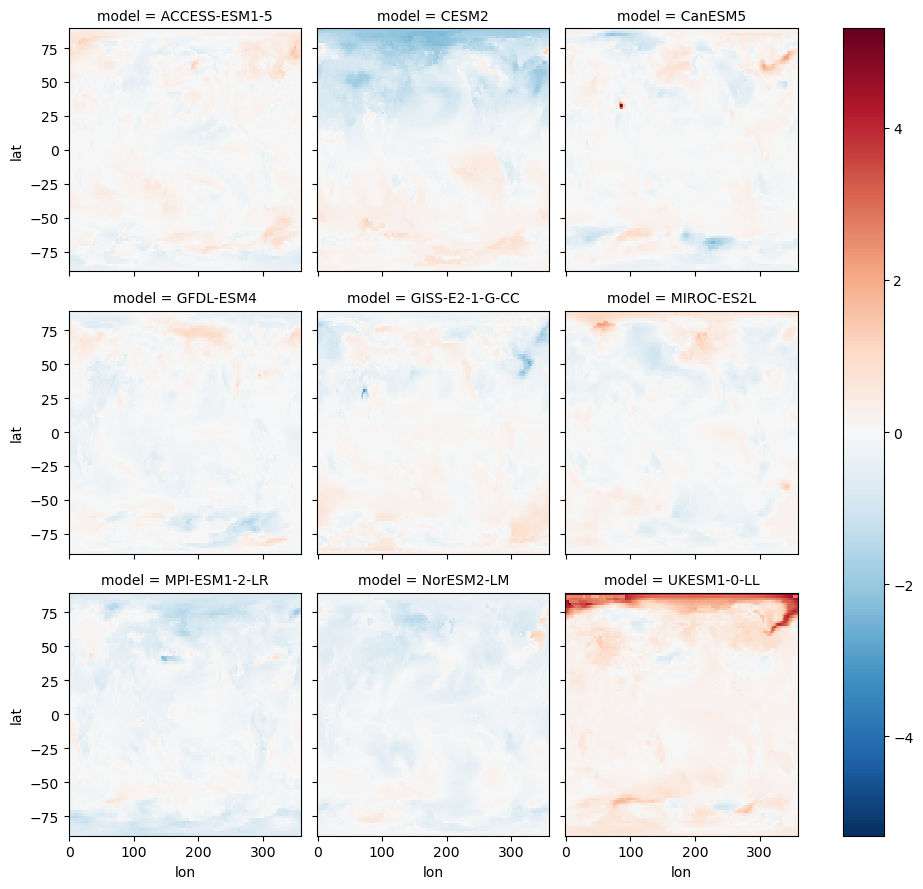

In [141]:
stable_anom_da.plot(col='model', col_wrap=3)

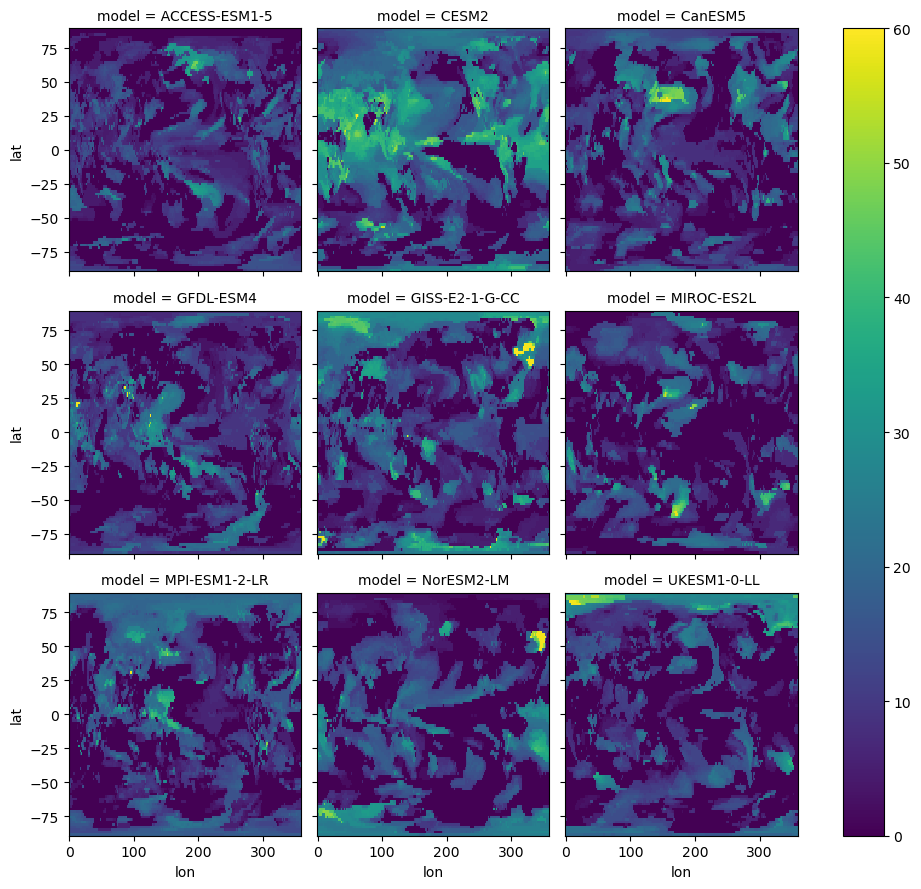

In [142]:
year_stable_ds.plot(col='model', col_wrap=3)

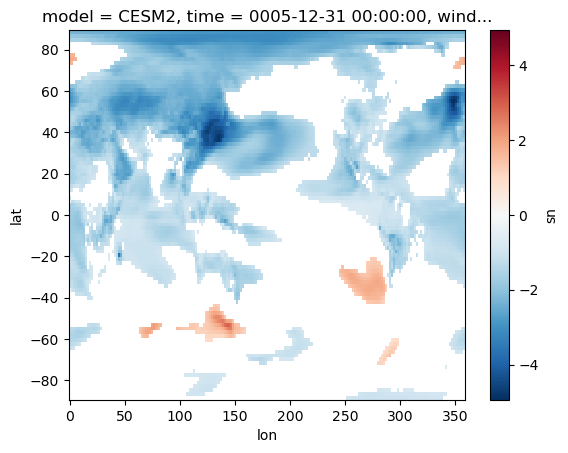

In [143]:
unstable_sn_ds.isel(window=-1, model=1, time=4).plot()

- full garbage collection released 105.29 MiB from 748 reference cycles (threshold: 9.54 MiB)


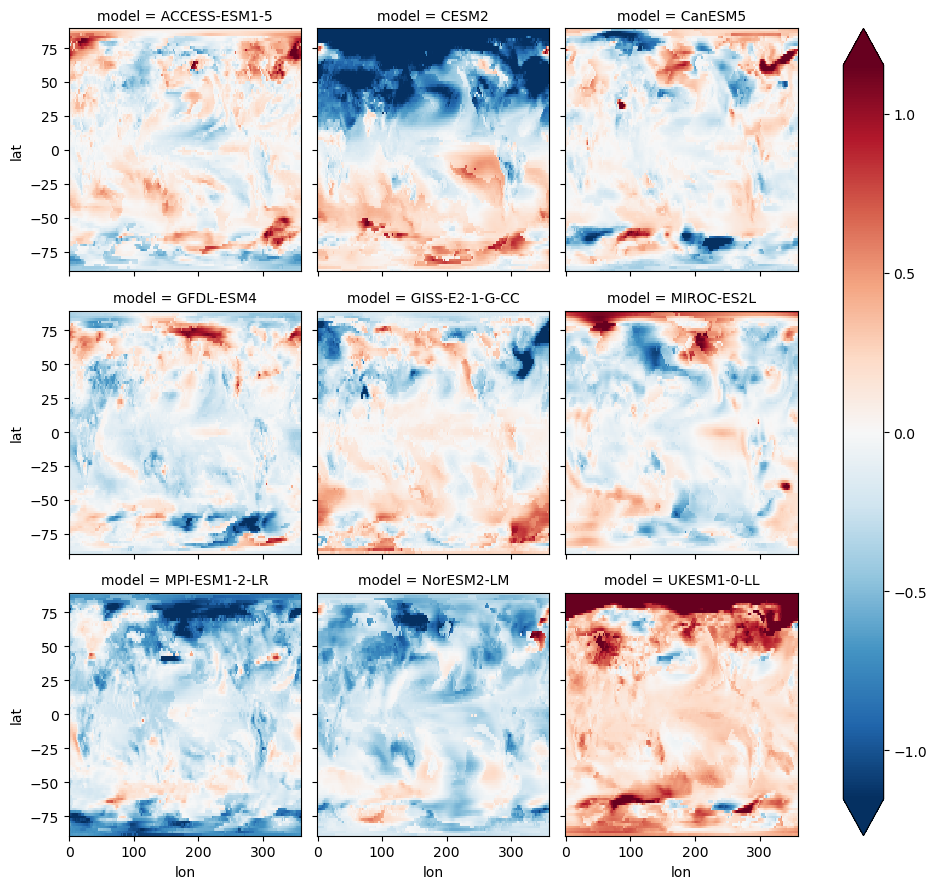

In [144]:
stable_anom_da.plot(col='model', col_wrap=3, robust=True)

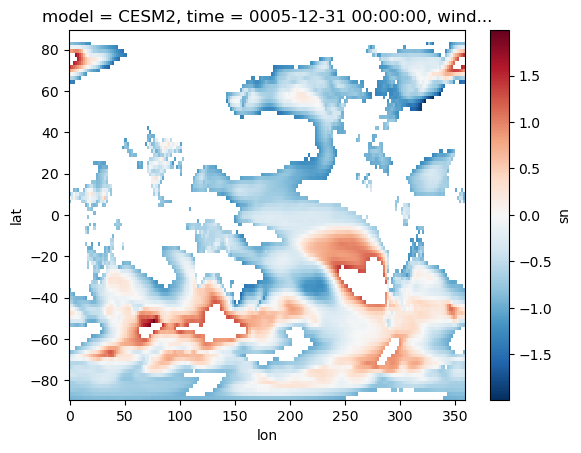

In [145]:
stable_sn_ds.isel(window=-1, model=1, time=4).plot()

In [146]:
projection = ccrs.PlateCarree(central_longitude=np.mean(year_stable_ds.lon.values))

In [147]:
projection = ccrs.PlateCarree(central_longitude=-90)
# np.mean(rolling_year_stable_window_max_ds.lon.values)-90

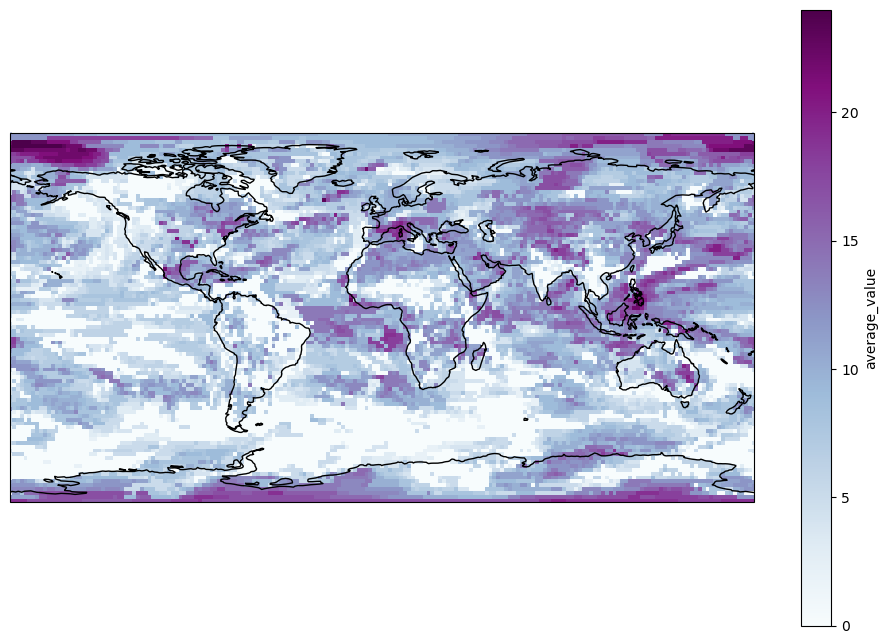

In [148]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111,projection=ccrs.PlateCarree())
year_stable_model_average.average_value.plot(ax=ax, cmap='BuPu')
ax.coastlines()

In [149]:
sn_ratio_a1_ds

<xarray.DataArray 'sn' (window: 31, model: 9, time: 60, lat: 96, lon: 192)> Size: 2GB
dask.array<chunksize=(10, 1, 60, 96, 192), meta=np.ndarray>
Coordinates:
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.3 358.1
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * time     (time) object 480B 0001-12-31 00:00:00 ... 0060-12-31 00:00:00
  * window   (window) int64 248B 10 11 12 13 14 15 16 ... 34 35 36 37 38 39 40

# Percent Regions

In [150]:
from typing import NamedTuple
from enum import Enum

In [151]:
class Region(NamedTuple):
    name: str
    slice: tuple

class regionLatLonTuples(Enum):
    GLOBAL = Region('gl', slice(None, None))
    LAND = Region('land', slice(None, None))
    OCEAN = Region('ocean', slice(None, None))
    NH = Region('nh', slice(0, None))
    SH = Region('sh', slice(None, 0))
    TROPICS = Region('tropics', slice(-23, 23))
    MID_LAT_SH = Region('mid_sh', slice(-66, -23))
    MID_LAT_NH = Region('mid_nh', slice(23, 66))
    ARCTIC = Region('arctic', slice(66, None))
    ANTARCTIC = Region('antarctic', slice(None, -66))


NAMING_MAP = {
    'global': 'Global',
    'nh': 'Northern Hemisphere',
    'sh': 'Southern Hemisphere',
    'tropics': 'Tropics',
    'land': 'Land',
    'ocean': 'Ocean',
    'mid_nh': 'Mid Latitudes NH',
    'mid_sh': 'Mid Latitudes SH',
    'arctic': 'Arctic',
    'antarctic': 'Antarctic'}

In [152]:
def fraction_comparison(ds_num, ds_denom, weights):
    """
    Calculate the percentage by comparing two datasets.

    Parameters:
        ds_num (xarray.Dataset): Numerator dataset.
        ds_denom (xarray.Dataset): Denominator dataset.
        weights (xarray.DataArray): Weights for the calculation.

    Returns:
        xarray.DataArray: Dataset containing the percentage.
    """
    # Calculate the sum of the numerator dataset weighted by weights
    ds_num_sum = ds_num.weighted(weights).sum(dim=['lat', 'lon'])

    # Calculate the sum of the denominator dataset weighted by weights
    ds_denom_sum = ds_denom.weighted(weights).sum(dim=['lat', 'lon'])

    # Calculate the percentage
    percent_ds = ds_num_sum / ds_denom_sum * 100

    return percent_ds

In [153]:
def calculate_returned_binary_ds(arr: ArrayLike, year_of_emergence: int, time_years: ArrayLike) -> ArrayLike:
    """
    Calculates a binary array representing the emergence of an event.

    E.g. after stabilisation all values will be 1, whilst before stabilisation
    all years will be 0

    Parameters:
        arr (ArrayLike): Input array.
        year_of_emergence (int): Year of the event's emergence.
        time_years (ArrayLike): Array of years.

    Returns:
        ArrayLike: Binary array representing the event's emergence.
                   0 before the year_of_emergence, 1 after.

    If year_of_emergence is NaN or all values in arr are NaN, the function
    returns arr unchanged.
    """

    #print(arr.shape, year_of_emergence, end='')
    # If the year_of_emergence is nan or all the values at the location are nan
    # then return nan
    
    if np.isnan(year_of_emergence): return arr

    # The integer arguement of where the time_years equals the emergence arg
    emergence_arg = np.argwhere(time_years == np.round(year_of_emergence))
    
    if len(emergence_arg) == 0:
        print(year_of_emergence)
        return np.nan
    if isinstance(emergence_arg, int): pass
    elif emergence_arg.shape == (1,1): emergence_arg = emergence_arg.item()
    
    to_return = np.zeros_like(arr)
    
    # Set all values to 1 after emergence has occured
    to_return[emergence_arg:] =  1

    return to_return

In [154]:
def create_regions(binary_emergence_ds: xr.Dataset, land_mask_ds:xr.Dataset) -> xr.Dataset:
    """
    Calculate the percentage of stability for regions based on binary emergence data.

    Parameters:
        binary_emergence_ds (xr.Dataset): Dataset containing binary emergence data.
        land_mask_ds (xr.Dataset): Dataset containing land mask data.
        only_1s_ds (xr.Dataset): Dataset with only values of 1. This is needed as it can differ
                                due to data availability

    Returns:
        xr.Dataset: Dataset with percentage of stability for each region.

    This function calculates the percentage of stability for regions based on binary
    emergence data and land mask information. It assumes the existence of a variable
    'only_1s_ds' that is the same shape as 'binary_emergence_ds' and contains only
    values of 1 where the event has occurred.
    """

    # Calculating the weights
    weights = np.cos(np.deg2rad(binary_emergence_ds.lat))
    weights.name = 'weights'

    # The two regions that need the land-sea make
    NEEDS_MASKING = ['land', 'ocean']

    ds_collection = [] # Storing all the datasets
    points_in_region_dict = {} # The number of 
    for region in regionLatLonTuples:
        region_name = region.value.name.lower()
        lat_slice = region.value.slice
        
        # Select data for the current region
        ds_region = binary_emergence_ds.sel(lat=lat_slice).expand_dims({'region':[region_name]})

        # Apply masking if needed
        if region_name in NEEDS_MASKING:
            mask_to_use_ds = xr.where(land_mask_ds, 1, 0) if region_name == 'land' else xr.where(land_mask_ds, 0, 1) 
            ds_region = ds_region.where(mask_to_use_ds)


        ds_collection.append(ds_region)

    ds_regions = xr.concat(ds_collection, dim='region')

    return ds_regions

In [155]:
# Calculating the weights
weights = np.cos(np.deg2rad(mask_ds.lat))
weights.name = 'weights'

In [156]:
# Using the year when each window becomes stable. Create a data set that is
# 0 when unstable and 1 when stable. 
binary_stability_ds = xr.apply_ufunc(
    calculate_returned_binary_ds,
    unstable_sn_ds.isel(window=0), # This is just a place holder, used for the shape
    year_stable_ds,
    unstable_sn_ds.time.dt.year-1, # Subtracting one, as this is ofset by 1
    input_core_dims = [['time'], [], ['time']],
    output_core_dims=[['time']],
    vectorize=True,
    dask='parallelized'
)

In [157]:
# A dataset with every point as 1, this is useful for getting the maximum weighted sum for a field
full_ds = xr.where(np.isfinite(binary_stability_ds), 1, 1)

In [158]:
binary_ds_rergions = create_regions(binary_stability_ds, mask_ds.mask)

In [159]:
full_ds_regions = create_regions(full_ds,  mask_ds.mask)

In [160]:
percent_stable_timeseries_ds = fraction_comparison(binary_ds_rergions, full_ds_regions, weights)

In [161]:
region_order = ['gl', 'nh', 'sh', 'land', 'ocean', 'arctic', 'antarctic', 'mid_nh', 'mid_sh', 'tropics']
percent_stable_timeseries_ds = percent_stable_timeseries_ds.sel(region=region_order)

In [162]:
# Opposite of the above: Stable replace with 0n and unstable is 1.
# The opposite is need as we are looking at when the percetage of unstable points becomes 0
binary_unstable_ds = xr.where(binary_stability_ds, 0, 1)
binary_unstable_warm_ds = binary_unstable_ds.where(stable_anom_da>0)
binary_unstable_cool_ds = binary_unstable_ds.where(stable_anom_da<=0)

In [163]:
# The number of cooling and warming trends at each grid cell
number_warm_ds = fraction_comparison(binary_unstable_warm_ds, full_ds, weights).expand_dims(region=['global_warm']) 
number_cool_ds = fraction_comparison(binary_unstable_cool_ds, full_ds, weights).expand_dims(region=['global_warm']) 

In [178]:
number_cool_ds = number_cool_ds.compute()
number_warm_ds = number_warm_ds.compute()

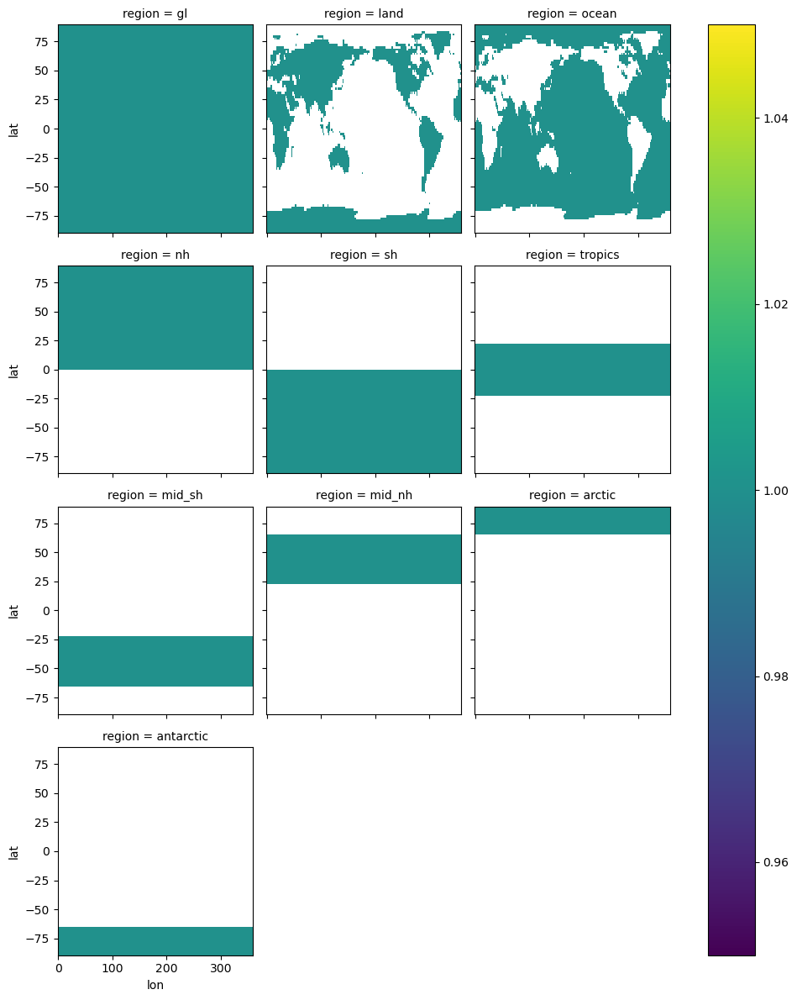

In [164]:
full_ds_regions.isel(model=0, time=1).plot(col='region', col_wrap=3)

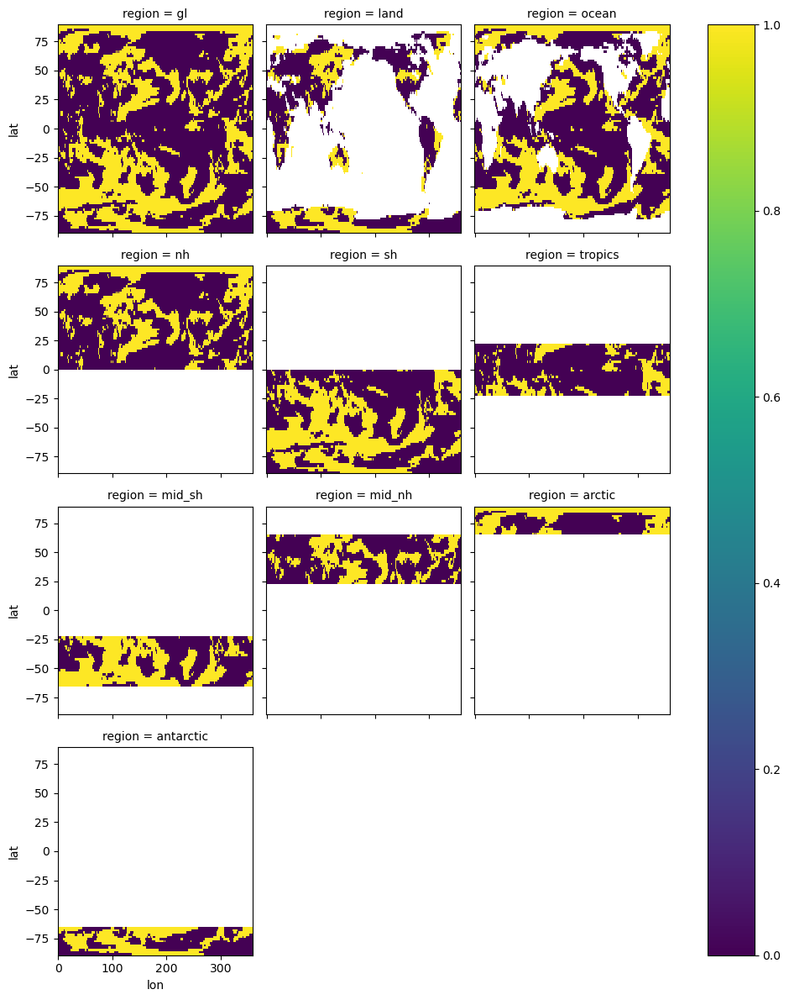

In [165]:
binary_ds_rergions.isel(model=0, time=1).plot(col='region', col_wrap=3)

## Plotting

In [169]:
units =  r'$^{\circ}C$'

In [170]:
NAMING_MAP = {'gl': 'Global',
 'nh': 'Northern Hemisphere',
 'sh': 'Southern Hemisphere',
 'tropics': 'Tropics',
 'land': 'Land',
 'ocean': 'Ocean',
 'mid_nh': 'Mid Latitudes NH',
 'mid_sh': 'Mid Latitudes SH',
 'arctic': 'Arctic',
 'antarctic': 'Antarctic',
 'global_warm': 'Warming Trends',
 'global_cool': 'Cooling Trends'}

In [171]:
linestyles = ['--', '-'] * int(np.ceil(len(percent_stable_timeseries_ds.model.values)/2))
linestyles

['--', '-', '--', '-', '--', '-', '--', '-', '--', '-']

In [172]:
# linestyle_dict = {'ACCESS-ESM1-5': '--','CESM2': '-','CanESM5': '--','GFDL-ESM4': '-','GISS-E2-1-G-CC': '--',
#                   'MIROC-ES2L': '-','MPI-ESM1-2-LR': '--','NorESM2-LM': '-','UKESM1-0-LL': '--'}

In [173]:
ZEC_LINESTYLE_DICT = {
    'GISS-E2-1-G-CC': {'value': -0.09, 'color': '#add8e6', 'linestyle':  (0, (1, 1))},
     'CanESM5': {'value': -0.102, 'color': '#87ceeb', 'linestyle': '-'},
     'MIROC-ES2L': {'value': -0.109, 'color': '#6495ed', 'linestyle': ':'},
     'GFDL-ESM4': {'value': -0.205, 'color': '#4169e1', 'linestyle': '--'},
     'MPI-ESM1-2-LR': {'value': -0.27, 'color': '#1e90ff', 'linestyle': '-'},
     'CESM2': {'value': -0.31, 'color': '#0000cd', 'linestyle': '-'},
     'NorESM2-LM': {'value': -0.334,'color': '#00008b','linestyle': (0, (5, 1, 1, 1))},
     'ACCESS-ESM1-5': {'value': 0.011, 'color': [0.99, 0.7 , 0.48, 1.  ], 'linestyle': ':'},
     'UKESM1-0-LL': {'value': 0.289, 'color': [0.79, 0.11, 0.07, 1.  ]}}

In [181]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

{'linestyle': '-', 'color': '#87ceeb', 'linewidth': 2}


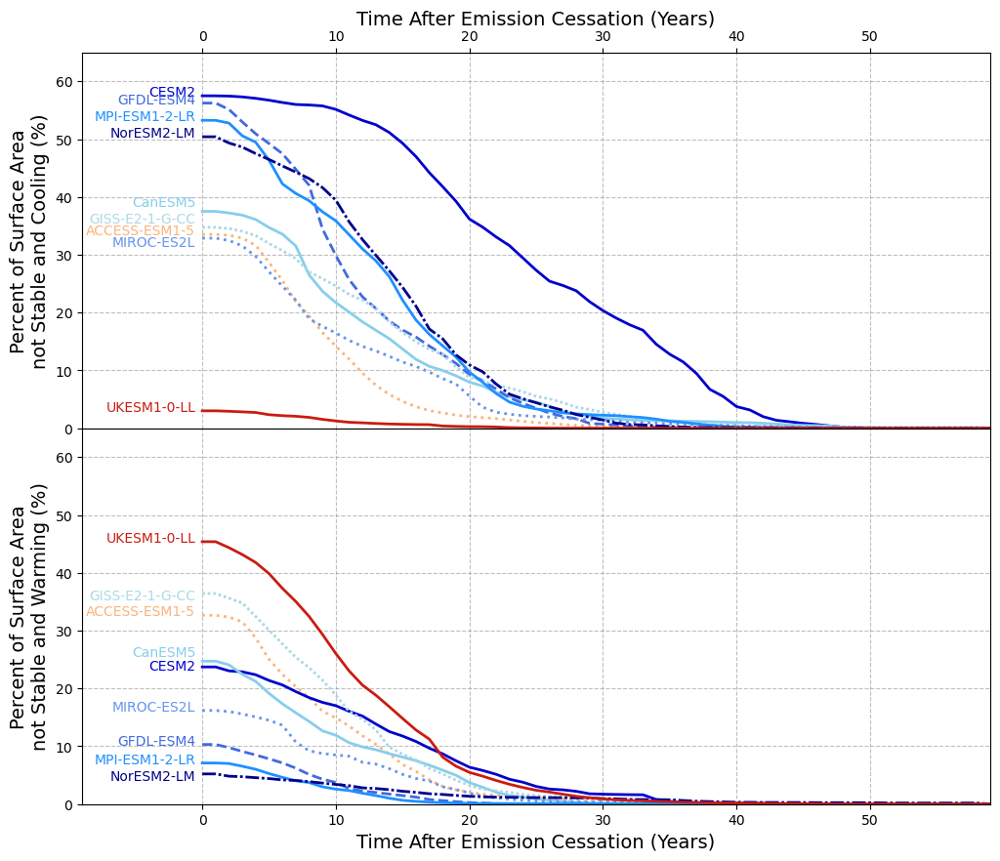

In [189]:
fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(2, 1, hspace=0)

ax_left = fig.add_subplot(gs[0])
ax_right = fig.add_subplot(gs[1])


time = number_cool_ds.time.dt.year.values

for num, model in enumerate(number_cool_ds.model.values):
    line_format_dict = dict(
        linestyle = ZEC_LINESTYLE_DICT[model].get('linestyle', '-'),
        color =  ZEC_LINESTYLE_DICT[model].get('color', 'black'),
        linewidth=2)
    

    if 'CanESM5' in model: print(line_format_dict)
    ax_left.plot(time, number_cool_ds.sel(model=model).squeeze().values, label='Cooling', **line_format_dict)
    ax_right.plot(time, number_warm_ds.sel(model=model).squeeze().values, label='Warming', **line_format_dict)
    
    ytext1 = number_cool_ds.sel(model=model).squeeze().values[0]-0.1
    ytext2 = number_warm_ds.sel(model=model).squeeze().values[0]-0.1

    # For to plot
    if 'MIROC' in model: ytext1 = ytext1-1.4
    if 'CanESM5' in model: ytext1 = ytext1+1
    if 'GISS' in model: ytext1 = ytext1+0.8


    # For bottom plot
    if 'Nor' in model: ytext2 = ytext2-1
    if 'GISS' in model: ytext2 = ytext2-1
    # if 'ACCESS' in model: ytext2 = ytext2+1
    if 'CanESM5' in model: ytext2 = ytext2+1
    if 'CESM2' in model: ytext2 = ytext2-0.5


    ax_left.annotate(model, xy=(time[0]-0.5, ytext1),ha='right', color=line_format_dict['color'])
    ax_right.annotate(model, xy=(time[0]-0.5, ytext2),ha='right', color=line_format_dict['color'])
    
sn_plotting.format_xticks(ax_right, time, time-1)
sn_plotting.format_xticks(ax_left, time, time-1)

ax_right.set_ylabel('Percent of Surface Area\nnot Stable and Warming (%)', fontsize=14)
ax_left.set_ylabel('Percent of Surface Area\nnot Stable and Cooling (%)', fontsize=14)


for ax in [ax_right, ax_left]:
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    ax.set_xlim(-8, 60)
    ax.set_ylim(0, 65)    

ax_right.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
ax_left.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)

ax_left.xaxis.set_label_position('top')
ax_left.xaxis.tick_top()

In [192]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

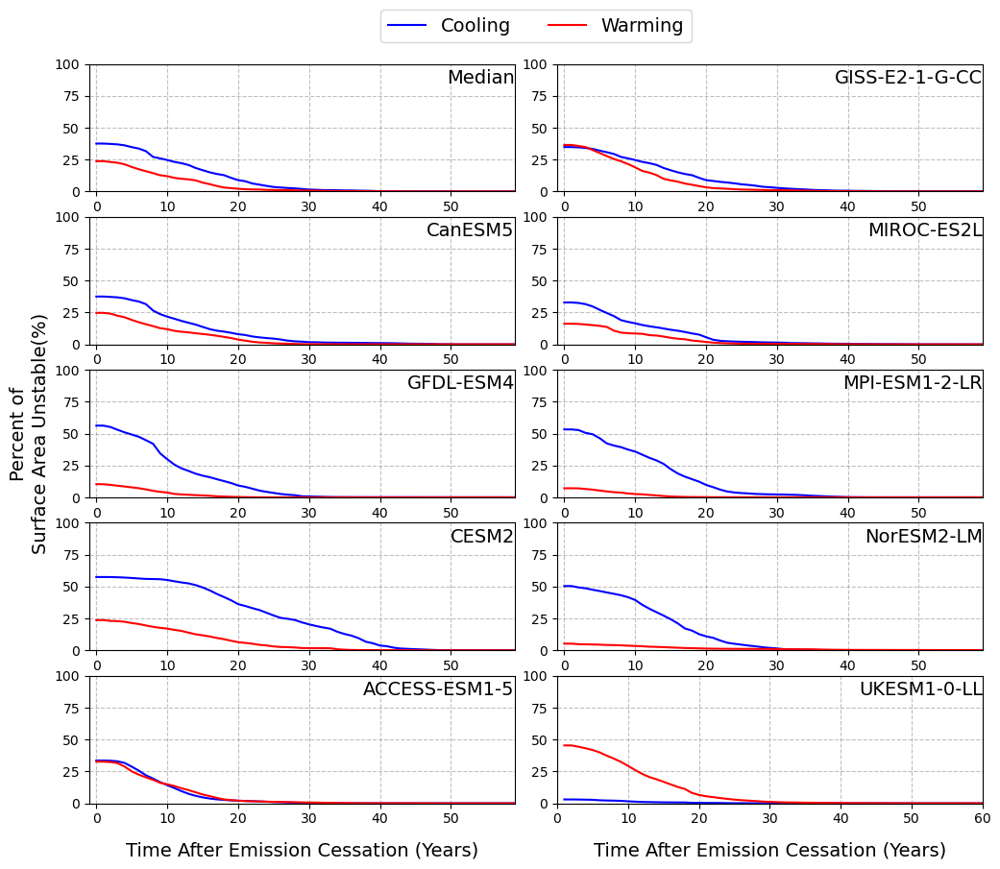

In [194]:
ncols = 2
nrows = int(np.ceil(len(sn_plotting.ZECMIP_MODEL_PARAMS)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=.2, wspace=.1)
axes = [fig.add_subplot(gs[i]) for i in range(10)]


time = number_cool_ds.time.dt.year.values

for num, model in enumerate(sn_plotting.ZECMIP_MODEL_PARAMS):

    ax = axes[num+1]
    ax.plot(time, number_cool_ds.sel(model=model).squeeze().values, color='blue', label='Cooling')
    ax.plot(time, number_warm_ds.sel(model=model).squeeze().values, color='red', label='Warming')
    
    ax.annotate(model, xy=(1, 0.85), fontsize=14, xycoords='axes fraction', ha='right')
    
    sn_plotting.format_xticks(axes[num], time, time-1)

    if num==3: ax.set_ylabel('Percent of\nSurface Area Unstable(%)', fontsize=14)

ax = axes[0]
ax.plot(time, number_cool_ds.median(dim='model').squeeze().values, color='blue', label='Cooling')
ax.plot(time, number_warm_ds.median(dim='model').squeeze().values, color='red', label='Warming')
ax.annotate('Median', xy=(1, 0.85), ha='right', fontsize=14, xycoords='axes fraction')

for ax in axes:
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    ax.set_xlim(0, 60)
    ax.set_ylim(0, 100)    

sn_plotting.format_xticks(axes[num], time, time-1)


# Place the legend at the center just above the first row of plots
# Adjust the bbox_to_anchor values to center the legend
leg = axes[1].legend(ncol=2, bbox_to_anchor=[-0.05, 1.5], loc='upper center', fontsize=14)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);
axes[-2].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

In [195]:
# Sorting the models by their ZEC values
zec_values = list(map(lambda x: x['value'], list(ZEC_LINESTYLE_DICT.values())))
models = np.array(list(ZEC_LINESTYLE_DICT))
models_sorted = models[np.argsort(zec_values)]

In [196]:
models_sorted

array(['NorESM2-LM', 'CESM2', 'MPI-ESM1-2-LR', 'GFDL-ESM4', 'MIROC-ES2L',
       'CanESM5', 'GISS-E2-1-G-CC', 'ACCESS-ESM1-5', 'UKESM1-0-LL'],
      dtype='<U14')

In [217]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

In [218]:
percent_stable_timeseries_ds = percent_stable_timeseries_ds.compute()

In [266]:
percent_stable_timeseries_ds

<xarray.DataArray (region: 10, model: 9, time: 60)> Size: 43kB
33.8 33.8 34.28 35.59 39.63 46.27 52.0 ... 100.0 100.0 100.0 100.0 100.0 100.0
Coordinates:
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'
  * time     (time) object 480B 0001-12-31 00:00:00 ... 0060-12-31 00:00:00
  * region   (region) object 80B 'gl' 'nh' 'sh' ... 'mid_nh' 'mid_sh' 'tropics'
    window   int64 8B 10

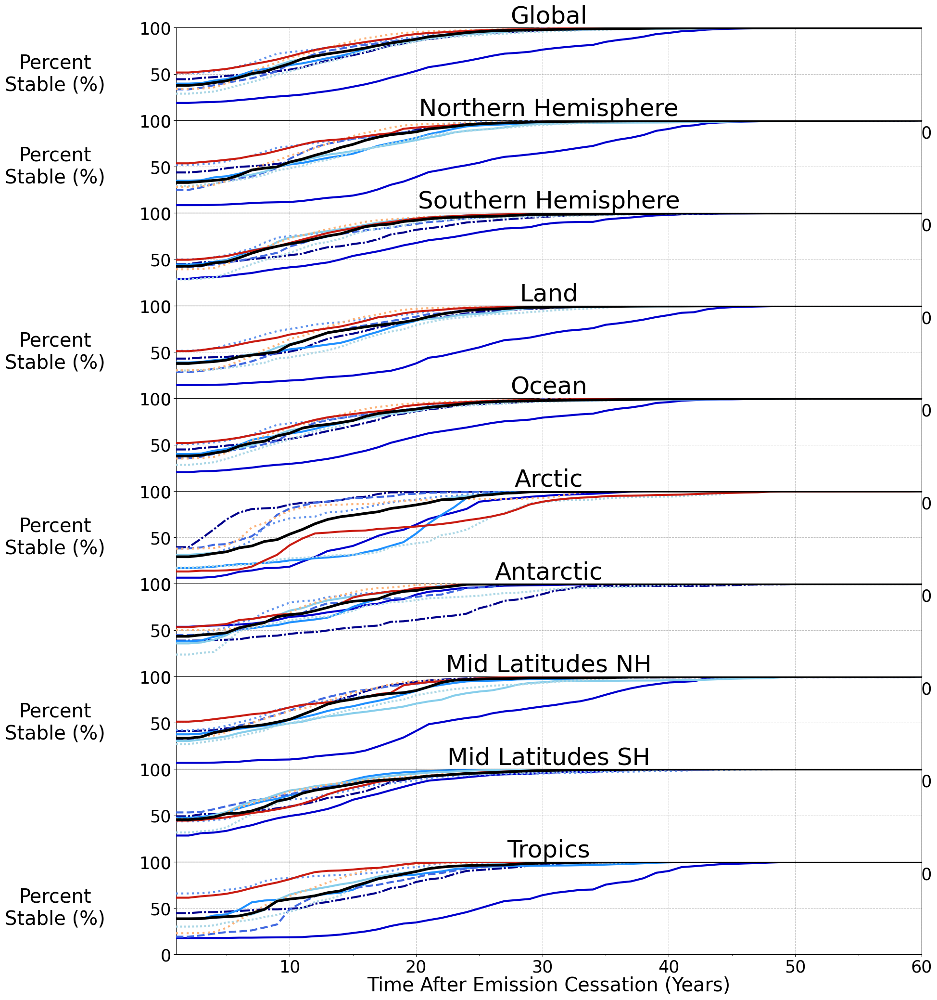

In [265]:
### Plot set-up

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2,
                        font_scale=1.8, xlim=(0, 59), bbox_to_anchor=(1, 0.75))
left_kwargs = dict(ylabel='Percent\nStable (%)')


line_plot_kwargs['ylim'] = (0, 100) #if window == 40 else (40, 100)

### Plot Creation
nplots = len(percent_stable_timeseries_ds.region.values)
fig = plt.figure(figsize=(20, 25))
gs = gridspec.GridSpec(nplots, 1, wspace=0, hspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(nplots)]

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(
        percent_stable_timeseries_ds.sel(model=models_sorted).sel(region=reg), fig=fig, ax=axes[num],
        title=NAMING_MAP[reg], params=ZEC_LINESTYLE_DICT, 
        add_legend=False,#, if num < len(percent_stable_timeseries_ds.region.values)-1 else True,
        logginglevel='ERROR', legend_fontsize=16,
        **kwargs_to_use, **line_plot_kwargs);

# for num, ax in enumerate(axes):
#     title = ax.get_title()
#     ax.set_title('')
#     # Remove the first and last yticks so it doesn't overlap with the next/previous plot.
#     ax.set_yticks(np.take(ax.get_yticks(), np.arange(1, len(ax.get_yticks())-1)))
#     ax.annotate(title, xy=(0.01, 0.85), xycoords='axes fraction', size=plotting_functions.PlotConfig.title_size*1.4)
#     if not num%2 and num >1: ax.set_yticklabels([])
#     if 1 < num < 8: ax.set_xticklabels([]) # Need or the last number can still be seen

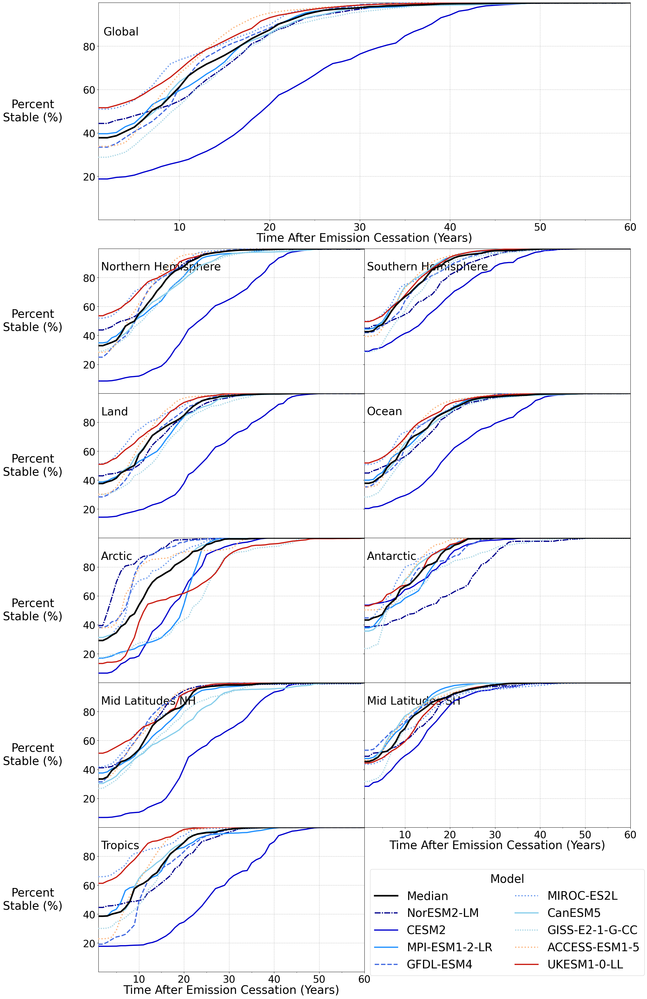

In [219]:
### Plot set-up

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2,
                        font_scale=1.8, xlim=(0, 59), bbox_to_anchor=(1, 0.75))
left_kwargs = dict(ylabel='Percent\nStable (%)')


line_plot_kwargs['ylim'] = (0, 100) #if window == 40 else (40, 100)

### Plot Creation
nplots = len(percent_stable_timeseries_ds.region.values)+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2))+1, 2, height_ratios=[1.5]+[0.2] + [1]*int(np.ceil((nplots-2)/2)), wspace=0, hspace=0)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+4]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(percent_stable_timeseries_ds.sel(model=models_sorted).sel(region=reg), fig=fig, ax=axes[num],
                                     title=NAMING_MAP[reg], params=ZEC_LINESTYLE_DICT, 
                                     add_legend=False if num < len(percent_stable_timeseries_ds.region.values)-1 else True,
                                     logginglevel='ERROR', legend_fontsize=16,
                                     **kwargs_to_use, **line_plot_kwargs);

for num, ax in enumerate(axes):
    title = ax.get_title()
    ax.set_title('')
    # Remove the first and last yticks so it doesn't overlap with the next/previous plot.
    ax.set_yticks(np.take(ax.get_yticks(), np.arange(1, len(ax.get_yticks())-1)))
    ax.annotate(title, xy=(0.01, 0.85), xycoords='axes fraction', size=plotting_functions.PlotConfig.title_size*1.4)
    if not num%2 and num >1: ax.set_yticklabels([])
    if 1 < num < 8: ax.set_xticklabels([]) # Need or the last number can still be seen

In [221]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

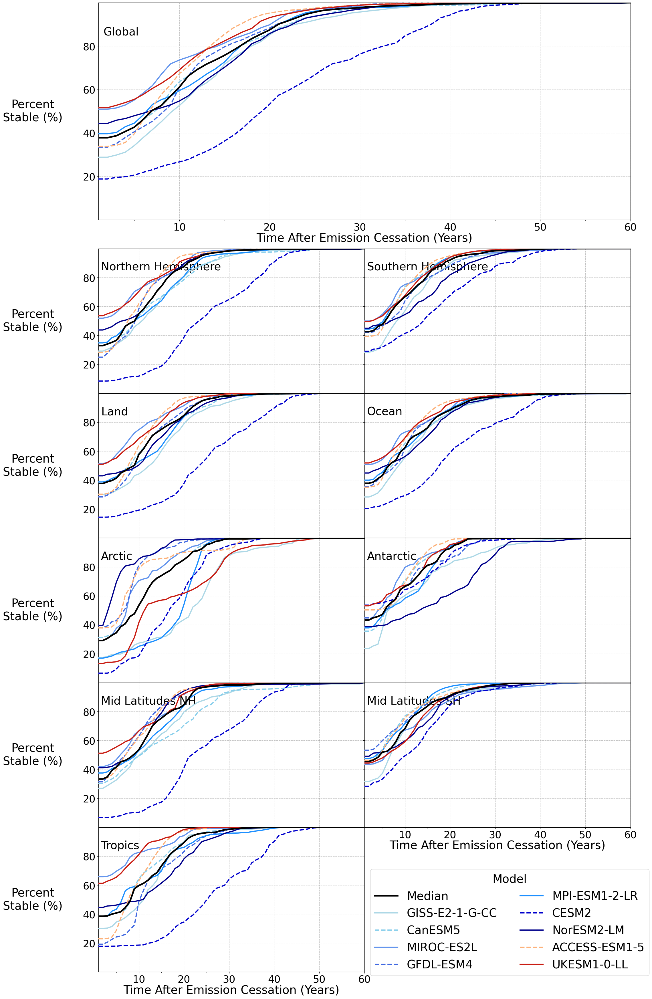

In [222]:
### Plot set-up

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2,
                        exp_type='zecmip', font_scale=1.8, xlim=(0, 59), bbox_to_anchor=(1, 0.75))
left_kwargs = dict(ylabel='Percent\nStable (%)')


line_plot_kwargs['ylim'] = (0, 100) #if window == 40 else (40, 100)

### Plot Creation
nplots = len(percent_stable_timeseries_ds.region.values)+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2))+1, 2, height_ratios=[1.5]+[0.2] + [1]*int(np.ceil((nplots-2)/2)), wspace=0, hspace=0)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+4]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(percent_stable_timeseries_ds.sel(region=reg), fig=fig, ax=axes[num],
                                     title=NAMING_MAP[reg], #linestyle=linestyle_dict, 
                                     add_legend=False if num < len(percent_stable_timeseries_ds.region.values)-1 else True,
                                     logginglevel='ERROR', legend_fontsize=16,
                                     **kwargs_to_use, **line_plot_kwargs);

for num, ax in enumerate(axes):
    title = ax.get_title()
    ax.set_title('')
    # Remove the first and last yticks so it doesn't overlap with the next/previous plot.
    ax.set_yticks(np.take(ax.get_yticks(), np.arange(1, len(ax.get_yticks())-1)))
    ax.annotate(title, xy=(0.01, 0.85), xycoords='axes fraction', size=plotting_functions.PlotConfig.title_size*1.4)
    if not num%2 and num >1: ax.set_yticklabels([])
    if 1 < num < 8: ax.set_xticklabels([]) # Need or the last number can still be seen

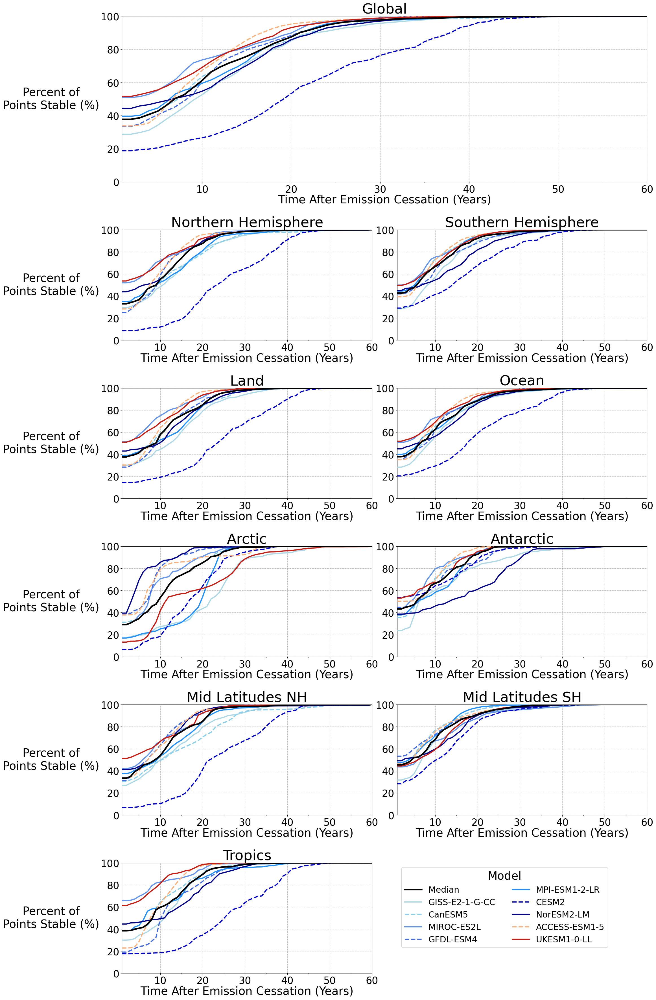

In [223]:

line_plot_kwargs = dict(xlabel='Time After Emission Cessation (Years)', labelpad=70, ncol=2, exp_type='zecmip', font_scale=1.8,
                        xlim=(0, 59), ylim=(0, 100), bbox_to_anchor=(1.1,1))
left_kwargs = dict( ylabel='Percent of\nPoints Stable (%)')

window = 40
plt.style.use('default')
nplots = len(percent_stable_timeseries_ds.region.values)+1
fig = plt.figure(figsize=(12*2, 4*nplots))
gs = gridspec.GridSpec(int(np.ceil(nplots/2)), 2, height_ratios=[1.5] + [1]*int(np.ceil((nplots-2)/2)), wspace=0.1, hspace=0.4)
ax0 = fig.add_subplot(gs[0, :]); axes = [fig.add_subplot(gs[i+2]) for i in range(nplots-2)]
axes.insert(0, ax0)

for num, reg in enumerate(percent_stable_timeseries_ds.region.values):
    kwargs_to_use = left_kwargs if ((num%2) or (num==0)) else {}
    sn_plotting.plot_all_coord_lines(percent_stable_timeseries_ds.sel(region=reg), fig=fig, ax=axes[num],
                                     title=NAMING_MAP[reg],add_legend=False if num < len(percent_stable_timeseries_ds.region.values)-1 else True, liensytle=linestyles,
                                     **kwargs_to_use, **line_plot_kwargs);
    #axes[num].set_xlim([stable_sn_da.time.values[0], stable_sn_da.time.values[-1]]); axes[num].set_ylim(0, 100)

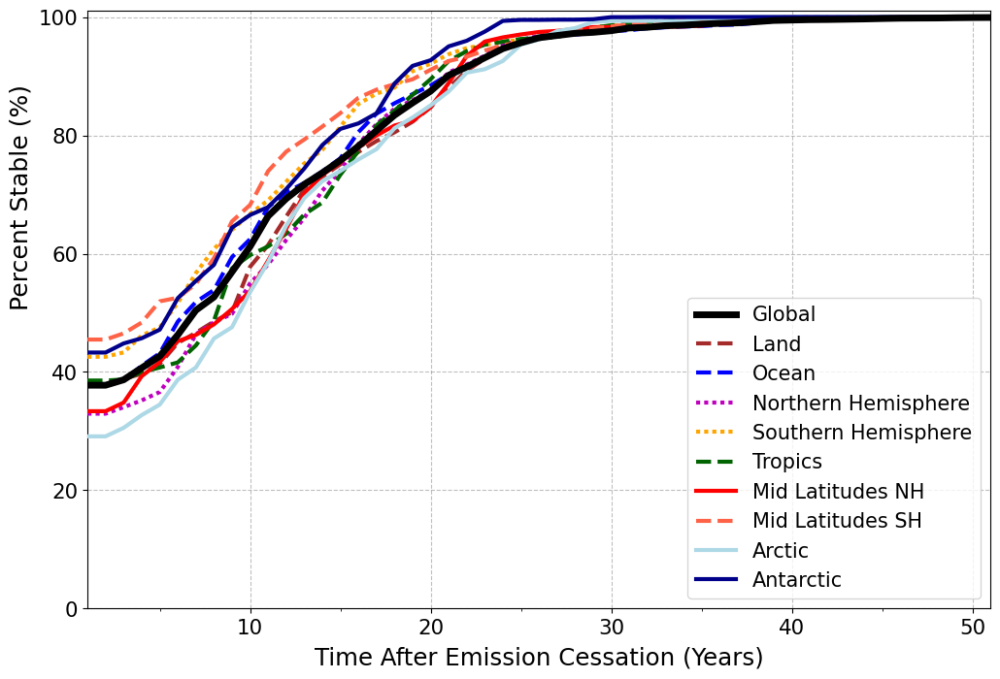

<Figure size 1500x700 with 0 Axes>

In [224]:
line_plot_kwargs_median = dict(xlabel='Time After Emission Cessation (Years)', ylabel='',
                               labelpad=70, font_scale=1.1,xlim=(0, 50), ylim=(0, 101), consensus=False)

fig = plt.figure(figsize=(12, 4*2))
ax = fig.add_subplot(111)

fig, ax, leg = sn_plotting.plot_all_coord_lines(
    percent_stable_timeseries_ds.median(dim='model'),
    ax=ax, coord='region', exp_type='region', linestyle=linestyles, 
    add_legend=True, bbox_to_anchor=(1.03,-0.15), **line_plot_kwargs_median)

ax.set_ylabel('Percent Stable (%)', size=18, ha='left')

# Update the legend elements. Get the legend labels
labels = [text.get_text() for text in leg.get_texts()]
for old_label, new_label in NAMING_MAP.items():
    try:
        leg.get_texts()[labels.index(old_label)].set_text(new_label)
    except ValueError: pass


legend_handles = leg.legendHandles
legend_texts = [t.get_text() for t in leg.get_texts()]
new_order = ['Global'] + [t for t in legend_texts if t != 'Global']

# Create a new legend
leg = ax.legend([handle for _, handle in sorted(zip(legend_texts, legend_handles), 
                                                key=lambda pair: new_order.index(pair[0]))], new_order, 
               fontsize=15)

# Maps

In [225]:
# One projeciton for when it is to be passed into a function. The other is when I am using it here.
# The passed function version also then used the same central longitude.
projection = ccrs.PlateCarree
projection_init = ccrs.PlateCarree(central_longitude=np.mean(year_stable_model_average.lon.values))

In [228]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

Text(0.5, 1.0, '')

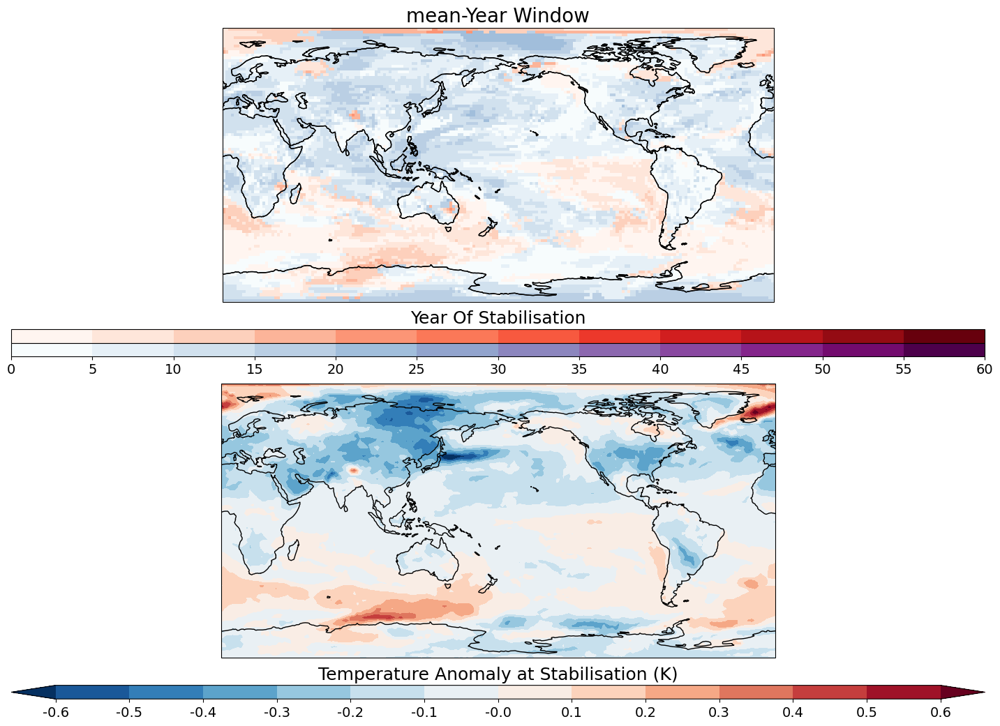

In [230]:
fig = plt.figure(figsize=(18, 12.5))
height_ratios = [1, 0.1, 0.05, 0.05, 0.1, 1, 0.1, 0.05]
gs = gridspec.GridSpec(len(height_ratios), 1, height_ratios=height_ratios, hspace=0)
### Year of Stabilisation
vm=60; step=5; levels_mean_stab = np.arange(0, vm+step, step)
universaL_kwargs = dict(ncols=2, font_scale=1, add_label=False, projection=projection)
top_kwargs = dict(dim='type',levels=levels_mean_stab, extend='neither', title_tag='-Year Window',
                 ptype='imshow')

# Create tha xis and color axis
top_ax = fig.add_subplot(gs[0], projection=projection_init)
# Space 1
top_cax1 = plt.subplot(gs[2])
top_cax2 = plt.subplot(gs[3])
# Space 4
bottom_ax = fig.add_subplot(gs[5, 0], projection=projection_init)
bottom_cax = plt.subplot(gs[7, 0])


# Where the stabilisation is with positive temperature anomalies
fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    year_stable_model_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')>=0).expand_dims(type=['mean']),
    fig=fig, gs=gs, axes = [top_ax],  cbar_title="Year Of Stabilisation", cmap='Reds', cax = top_cax1,
    **universaL_kwargs, **top_kwargs)

# Where the stabilisation is with negative temperature anomalies
fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    year_stable_model_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')<0).expand_dims(type=['mean']),
    fig=fig, gs=gs, axes = [top_ax], cmap='BuPu', cax = top_cax2,
    **universaL_kwargs, **top_kwargs)

# Remove the xticklabels and the xticks from the top colorbar
[cbar.ax.set_xticklabels([]) for cbar in cbar1]
[cbar.ax.set_xticks([]) for cbar in cbar1]

### Temperature Anomaly at Stabilisation
vm = .6; step=.1; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    stable_anom_da.mean(dim='model').expand_dims(type=['mean']), dim='type', levels=levels_mean_anom, cbar_title="Temperature Anomaly at Stabilisation (K)",
    fig=fig, gs=gs, add_title=False, axes = [bottom_ax], cax = bottom_cax,**universaL_kwargs)


bottom_ax.set_title('')

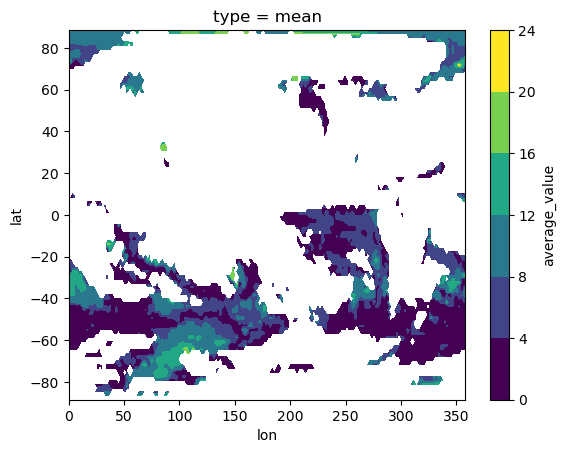

In [231]:
(year_stable_model_average['average_value']
 .squeeze()
 .where(stable_anom_da.mean(dim='model')>=0)
 .expand_dims(type=['mean'])
 .squeeze()
 .plot.contourf())

In [232]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

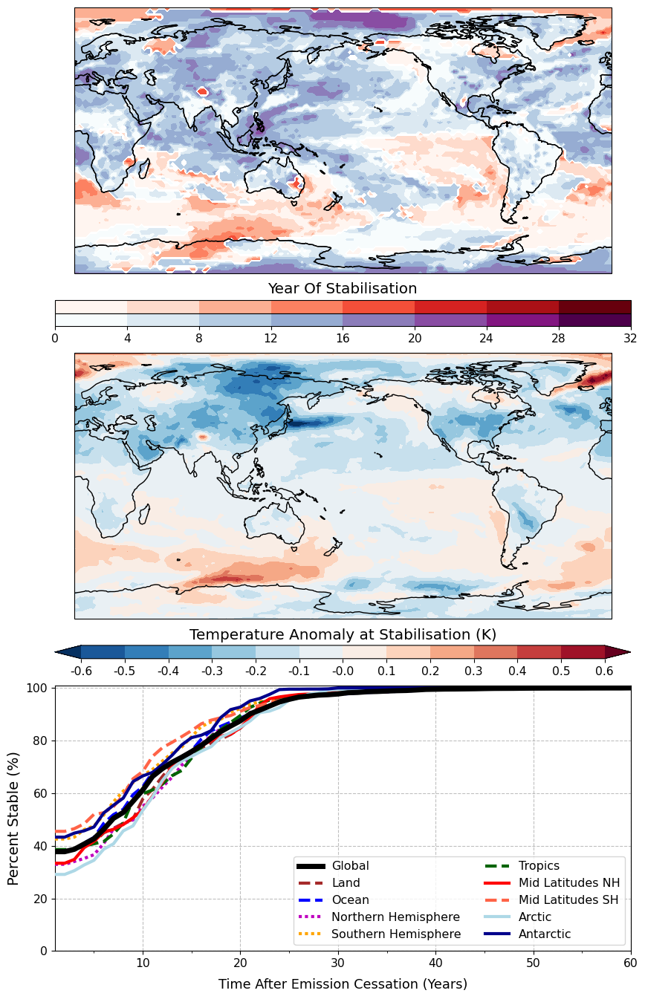

<Figure size 1500x700 with 0 Axes>

In [237]:
fig = plt.figure(figsize=(10, 16.5))
height_ratios = [1, 0.1, 0.05, 0.05, 0.1, 1, 0.1, 0.05, 0.1, 1]
gs = gridspec.GridSpec(len(height_ratios), 1, height_ratios=height_ratios, hspace=0)

### Year of Stabilisation
vm=32; step=4; levels_mean_stab = np.arange(0, vm+step, step)
universaL_kwargs = dict(ncols=2, font_scale=0.8, add_label=False, projection=projection, ptype='contourf')
top_kwargs = dict(dim='type',levels=levels_mean_stab, extend='neither', title_tag='-Year Window')


# Create tha xis and color axis
top_ax = fig.add_subplot(gs[0], projection=projection_init)
# Space 1
top_cax1 = plt.subplot(gs[2])
top_cax2 = plt.subplot(gs[3])
# Space 4
bottom_ax = fig.add_subplot(gs[5, 0], projection=projection_init)
bottom_cax = plt.subplot(gs[7, 0])



plot_kwargs = dict(ax=top_ax, transform=ccrs.PlateCarree(), cmap='Reds', levels=levels_mean_stab, extend='neither',
                   add_colorbar=False)
da_to_use = (year_stable_model_average['average_value']
             .squeeze().where(stable_anom_da.mean(dim='model')>=0).expand_dims(type=['mean'])).squeeze()
c = da_to_use.plot.contourf(**plot_kwargs)



fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    (year_stable_model_average['average_value']
     .squeeze().where(stable_anom_da.mean(dim='model')>=0).expand_dims(type=['mean'])),
    fig=fig, gs=gs, axes = [top_ax],  cbar_title="Year Of Stabilisation", cmap='Reds', cax = top_cax1,
    **universaL_kwargs, **top_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    (year_stable_model_average['average_value']
     .squeeze().where(stable_anom_da.mean(dim='model')<=0).expand_dims(type=['mean'])),
    fig=fig, gs=gs, axes = [top_ax], cmap='BuPu', cax = top_cax2,
    **universaL_kwargs, **top_kwargs)

# Remove the xticklabels and the xticks from the top colorbar
[cbar.ax.set_xticklabels([]) for cbar in cbar1]
[cbar.ax.set_xticks([]) for cbar in cbar1]

### Temperature Anomaly at Stabilisation
vm = .6; step=.1; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    stable_anom_da.mean(dim='model').expand_dims(type=['mean']), dim='type',
    levels=levels_mean_anom, cbar_title="Temperature Anomaly at Stabilisation (K)",
    fig=fig, gs=gs, add_title=False, axes = [bottom_ax], cax = bottom_cax,**universaL_kwargs)

top_ax.set_title('')

bottom_ax.set_title('')


line_plot_kwargs_median = dict(xlabel='Time After Emission Cessation (Years)', ylabel='',
                               labelpad=70, font_scale=0.8,xlim=(0, 59), ylim=(0, 101), consensus=False)

ax = fig.add_subplot(gs[9])

fig, ax, leg = sn_plotting.plot_all_coord_lines(
    percent_stable_timeseries_ds.median(dim='model'),
    ax=ax, coord='region', exp_type='region', linestyle=linestyles, 
    add_legend=True, bbox_to_anchor=(1.03,-0.15), **line_plot_kwargs_median)

ax.set_ylabel('Percent Stable (%)', size=14, ha='center')

# Update the legend elements. Get the legend labels
labels = [text.get_text() for text in leg.get_texts()]
for old_label, new_label in NAMING_MAP.items():
    try:
        leg.get_texts()[labels.index(old_label)].set_text(new_label)
    except ValueError: pass


legend_handles = leg.legendHandles
legend_texts = [t.get_text() for t in leg.get_texts()]
new_order = ['Global'] + [t for t in legend_texts if t != 'Global']

# Create a new legend
leg = ax.legend([handle for _, handle in sorted(zip(legend_texts, legend_handles), 
                                                key=lambda pair: new_order.index(pair[0]))], new_order, 
               fontsize=11.5, ncol=2)

In [238]:
percent_stable_timeseries_ds.isel(time=-1).values

array([[100.  ,  99.99, 100.  ,  99.99,  99.96, 100.  , 100.  , 100.  ,
        100.  ],
       [100.  ,  99.98, 100.  ,  99.98,  99.92, 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
        100.  ],
       [100.  ,  99.99, 100.  ,  99.99,  99.95, 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  , 100.  ,  99.98, 100.  , 100.  , 100.  ,
        100.  ],
       [100.  ,  99.97, 100.  , 100.  ,  99.85, 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  , 100.  ,
        100.  ],
       [100.  , 100.  , 100.  ,  99.98, 100.  , 100.  , 100.  , 100.  ,
        100.  ]])

In [239]:
import matplotlib.colors as mcolors
# Create a custom colormap with two colors: gray and transparent
colors = [(0, 0, 0, 0), 'blue',  '#6c5ce7', 'black']#(0.5, 0.5, 0.5, 1)]  # (R, G, B, Alpha)
cmap_binary = mcolors.LinearSegmentedColormap.from_list("binary_no_color", colors)

In [240]:
colors = np.concatenate([[[1,1,1,1]], plt.get_cmap('cool')(np.linspace(0, 1, 3))])
cmap_binary = mcolors.LinearSegmentedColormap.from_list("binary_no_color", colors)

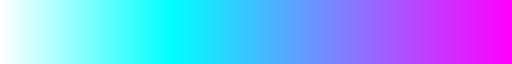

In [241]:
cmap_binary

In [242]:
def stability_achieved_rank(val):
    '''
    Defines the 

    '''
    if val >= 60: return 3
    if val >= 50: return 2
    if val >= 40: return 1
    return 0
    

In [243]:
stability_achieved_rank = np.vectorize(stability_achieved_rank)

In [244]:
stability_achieved_rank_ds = xr.zeros_like(year_stable_ds) + stability_achieved_rank(year_stable_ds)

In [245]:
stability_achieved_rank_ds

<xarray.DataArray (model: 9, lat: 96, lon: 192)> Size: 1MB
0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0
Coordinates:
  * lat      (lat) float64 768B -88.57 -86.72 -84.86 -83.0 ... 84.86 86.72 88.57
  * lon      (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.3 358.1
  * model    (model) <U14 504B 'ACCESS-ESM1-5' 'CESM2' ... 'UKESM1-0-LL'

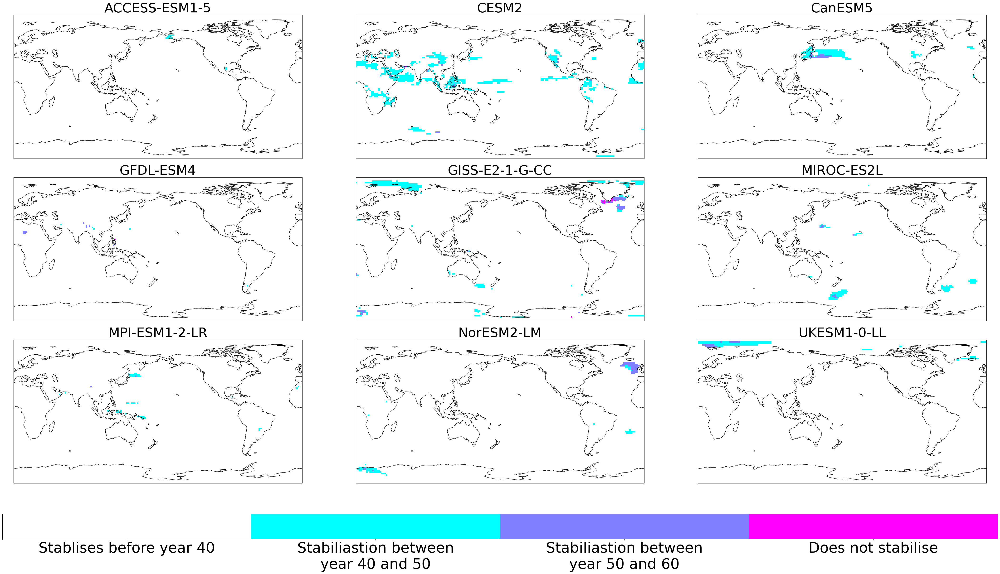

In [246]:

# 20-year window levels
# vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
# 40-year window levels
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 

ncols, nrows = 3, 3
num_plots = ncols * nrows

fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs_top = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, wspace=.1)
gs_bottom = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, hspace=0)

axes = [fig.add_subplot(gs_top[i], projection=projection_init) for i in range(0, num_plots)]
cax1 = plt.subplot(gs_bottom[nrows+0, :])

stable_plot_kwargs = dict(dim='model', extend='neither', add_label=False,
    max_stabilisation_year=60, font_scale=2, projection=ccrs.PlateCarree, ptype='imshow')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    stability_achieved_rank_ds, 
    fig=fig, gs=gs_top, axes=axes, cax=cax1, cmap=cmap_binary, levels=[0, 1, 2, 3,5],
    cbar_title="", **stable_plot_kwargs)

cbar1[0].ax.set_xticks([0.5,1.5, 2.5, 4])
cbar1[0].ax.set_xticklabels(['Stablises before year 40', 'Stabiliastion between\nyear 40 and 50', 
                             'Stabiliastion between\nyear 50 and 60',
                             'Does not stabilise'])
cbar1[0].ax.tick_params(labelsize=44)  # Set font size to 14

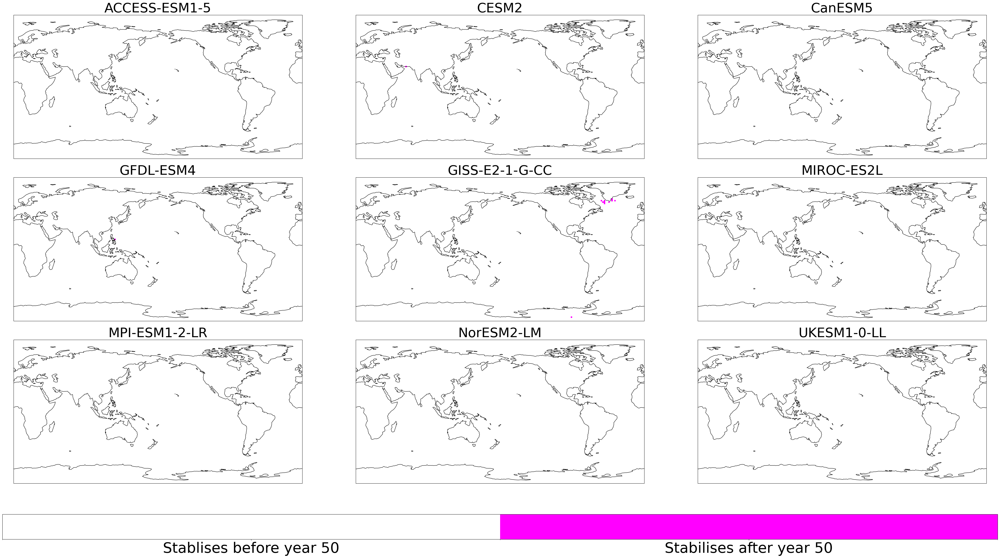

In [247]:

# 20-year window levels
# vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
# 40-year window levels
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 

ncols, nrows = 3, 3
num_plots = ncols * nrows

fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs_top = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, wspace=.1)
gs_bottom = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, hspace=0)

axes = [fig.add_subplot(gs_top[i], projection=projection_init) for i in range(0, num_plots)]
cax1 = plt.subplot(gs_bottom[nrows+0, :])



### Data plotting
# , stabilisation_method = 'blackout'
stable_plot_kwargs = dict(dim='model', extend='neither', add_label=False,
    max_stabilisation_year=60, font_scale=2, projection=ccrs.PlateCarree, ptype='imshow')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    xr.where(year_stable_ds >=60, 1, 0), 
    # xr.where(year_stable_ds >50, 1, 0), 
    fig=fig, gs=gs_top, axes=axes, cax=cax1, cmap=cmap_binary, levels=[0, 1, 2],
    cbar_title="", **stable_plot_kwargs)

cbar1[0].ax.set_xticks([0.5,1.5])
cbar1[0].ax.set_xticklabels(['Stablises before year 50', 'Stabilises after year 50'])
cbar1[0].ax.tick_params(labelsize=44)  # Set font size to 14

In [253]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

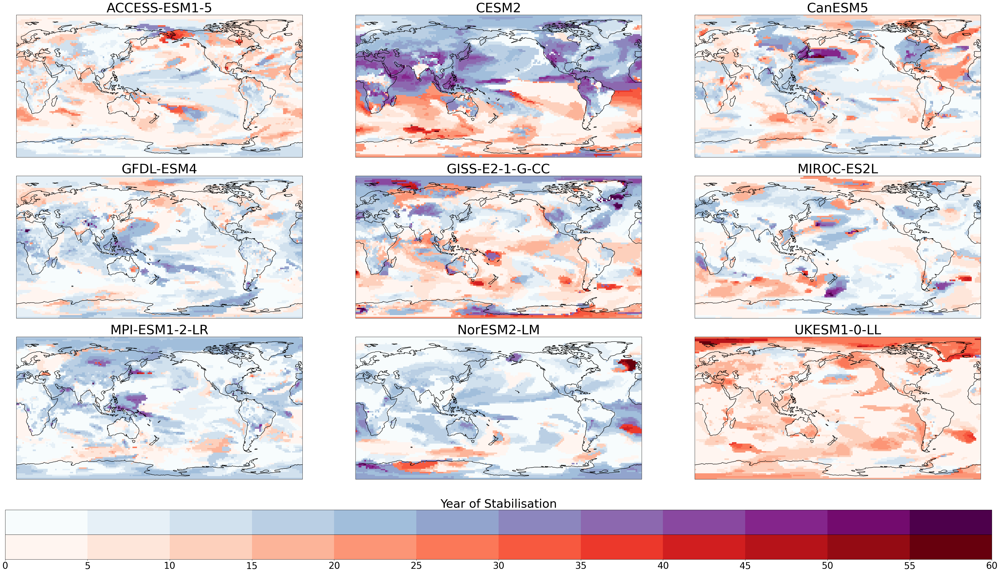

In [254]:

# 20-year window levels
# vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
# 40-year window levels
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 

ncols, nrows = 3, 3
num_plots = ncols * nrows

fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs_top = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, wspace=.1)
gs_bottom = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, hspace=0)

axes = [fig.add_subplot(gs_top[i], projection=projection_init) for i in range(0, num_plots)]
cax1 = plt.subplot(gs_bottom[nrows+0, :])
cax2 = plt.subplot(gs_bottom[nrows+1, :])

### Small calculations - splitting into warm stable and cool stable
year_stable_ds = year_stable_ds.squeeze()
stable_warm_ds = year_stable_ds.where(stable_anom_da>0)
stable_cool_ds = year_stable_ds.where(stable_anom_da<0)

### Data plotting
# , stabilisation_method = 'blackout'
stable_plot_kwargs = dict(dim='model', levels=levels_stable, extend='neither', add_label=False,
    max_stabilisation_year=60, stabilisation_method='blackout', font_scale=2, projection=ccrs.PlateCarree, ptype='imshow')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    stable_cool_ds, fig=fig, gs=gs_top, axes=axes, cax=cax1, cmap='BuPu',
    cbar_title="Year of Stabilisation", **stable_plot_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    stable_warm_ds, fig=fig, gs=gs_top, axes=axes, cax=cax2, cmap='Reds', **stable_plot_kwargs)

cbar1[0].ax.set_xticklabels([]);
cbar1[0].ax.set_xticks([]);

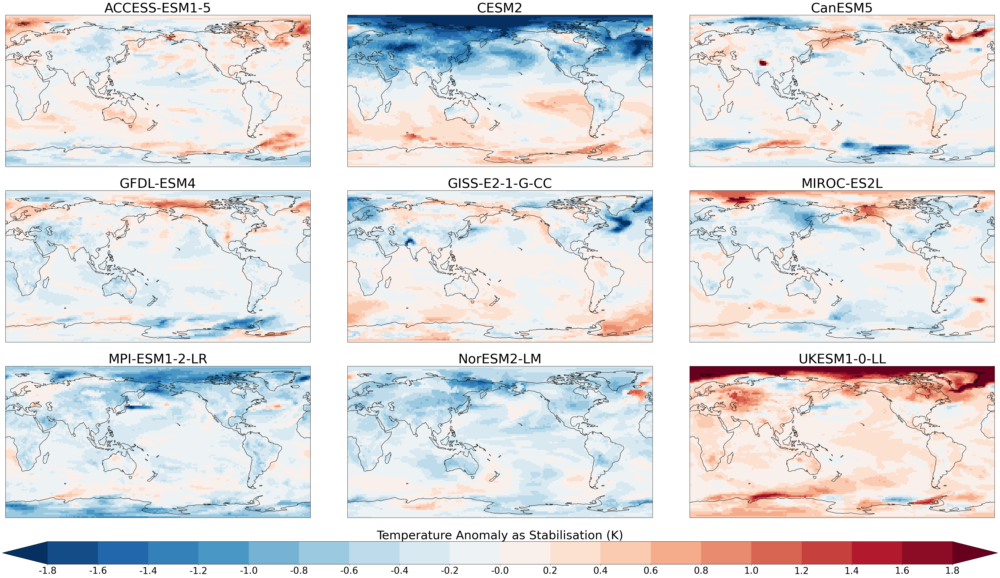

In [255]:
vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    stable_anom_da, dim='model', levels=levels_anom, 
    cbar_title="Temperature Anomaly as Stabilisation (K)", projection=ccrs.PlateCarree, add_label=False, font_scale=2, 
    logginglevel='ERROR', ptype='imshow')


In [257]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/zecmip_stabilisation/src/sn_plotting.py'>

In [258]:
sn_cmap, sn_levels = sn_plotting.generte_sn_cmap_and_levels(1/3)

[-3.   -2.67 -2.33 -2.   -1.67 -1.33 -1.   -0.67 -0.33]
[-0.33  0.    0.33  0.67  1.    1.33  1.67  2.    2.33  2.67  3.  ]


Text(0.5, 1.0, 'Upper S/N Ratio Bound')

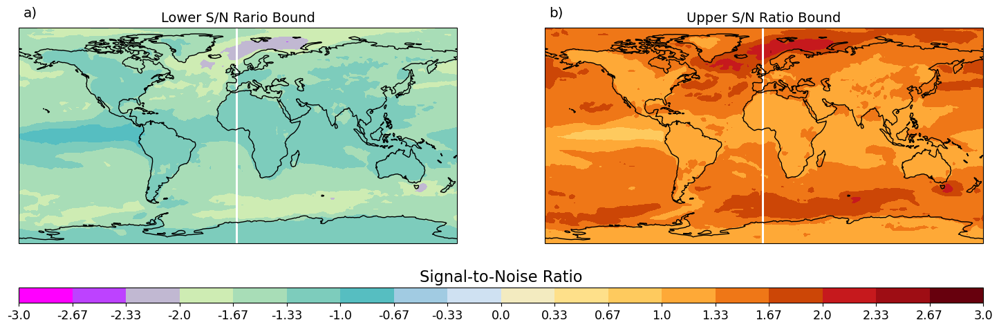

In [259]:
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(2, 2, height_ratios = [1, 0.05], hspace=0)
axes= [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
       fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())]

fig, gs, axes, cax = sn_plotting.map_plot_all_for_coords_3(
    sn_ratio_bounds_ds.median(dim='window').median(dim='model').to_array(dim='bound'), dim='bound',
    levels=sn_levels, projection=projection, cmap=sn_cmap, font_scale=0.9,
    cbar_title="Signal-to-Noise Ratio", extend='neither',
    fig=fig, gs=gs,
    axes =axes,
    cax = plt.subplot(gs[1, :]),
    add_colorbar=True,
)

axes[0].set_title('Lower S/N Rario Bound', fontsize=14)
axes[1].set_title('Upper S/N Ratio Bound', fontsize=14)


## SN Colorbar Cretaion

In [ ]:
projection = ccrs.PlateCarree(central_longitude=int(np.mean(sn_ratio_bounds_ds.lon.values)))

In [ ]:
import matplotlib.colors as mcolors

In [ ]:
extreme_lower_levels = np.arange(-3, -2.1, 0.2)
even_lower_levels = np.arange(-2, -1.1, 0.2)
lower_levels = np.arange(-1, 0.1, 0.2) 
middle_levels = np.arange(0, 1.2, 0.2)
upper_levels = np.arange(1, 2, 0.2)
extreme_levels = np.arange(2,3.2, 0.2)
sn_levels = np.unique(np.concatenate([extreme_lower_levels, even_lower_levels, lower_levels,
                                   middle_levels,upper_levels, extreme_levels]))
sn_levels

In [ ]:
# This is a complex colorbar creation.
# There are three colormaps, and I wan't to select different parts of them.
# THis is as I want a different colormap for all of the different levels above.

extreme_lower_levels = np.arange(-3, -2.1, 0.2)
even_lower_levels = np.arange(-2, -1.1, 0.2)
lower_levels = np.arange(-1, 0.1, 0.2) 
middle_levels = np.arange(0, 1.2, 0.2)
upper_levels = np.arange(1, 2, 0.2)
extreme_levels = np.arange(2,3.2, 0.2)
sn_levels = np.unique(np.concatenate([extreme_lower_levels, even_lower_levels, lower_levels,
                                   middle_levels,upper_levels, extreme_levels]))

base_cmapn1 = 'cool'
base_cmap0 = 'winter'
base_cmap1 = 'Blues_r'
base_cmap2 = 'YlOrBr'
base_cmap3 = 'Wistia'
base_cmap4 = 'Reds'

color_list_extremelower = plt.get_cmap(base_cmapn1)(np.linspace(0, 1, len(extreme_lower_levels)*3))
color_list_extremelower = color_list_extremelower[
    int(len(color_list_extremelower)*7/9):int(len(color_list_extremelower)*9/9)]

color_list_evenlower = plt.get_cmap(base_cmap0)(np.linspace(0, 1, len(even_lower_levels)*3))
color_list_evenlower = color_list_evenlower[int(len(color_list_evenlower)*1/9):int(len(color_list_evenlower*4/9))]

color_list_lower = plt.get_cmap(base_cmap1)(np.linspace(0, 1, len(lower_levels)*3))
color_list_lower = color_list_lower[int(len(color_list_lower)*1/9):int(len(color_list_lower*4/9))]

color_list_middle = plt.get_cmap(base_cmap2)(np.linspace(0, 1, len(middle_levels)*3))
color_list_middle = color_list_middle[int(len(color_list_middle)*1/9):int(len(color_list_middle)*4/9)]

color_list_upper = plt.get_cmap(base_cmap3)(np.linspace(0, 1, len(upper_levels)*3))
color_list_upper = color_list_upper[int(len(color_list_upper)*7/9):int(len(color_list_upper)*9/9)]

color_list_extreme = plt.get_cmap(base_cmap4)(np.linspace(0, 1, len(extreme_levels)*3))
color_list_extreme = color_list_extreme[int(len(color_list_extreme)*6/9):int(len(color_list_extreme)*9/9)]

# Mergine all the colours together
full_colorlist = np.concatenate([color_list_extremelower, color_list_evenlower, color_list_lower, 
                                 color_list_middle, color_list_upper, color_list_extreme])
my_cmap = mcolors.LinearSegmentedColormap.from_list("my_cmap",  full_colorlist)
my_cmap

In [ ]:
def extract_partial_color_map(cmap, start:int, end:int, number_partitions:int):
    
    color_list = plt.get_cmap(cmap)(np.linspace(0, 1, number_partitions))
    color_list = color_list[start:end]
    return color_list

In [ ]:
def extract_partial_color_map(cmap, start:int, required_legnth, scaling:int):

    number_partitions = required_legnth * scaling
    color_list = plt.get_cmap(cmap)(np.linspace(0, 1, number_partitions))
    color_list = color_list[start:start+required_legnth]
    return color_list

In [ ]:
step = 1/3
lower_levels = np.arange(-3, 0, step)
upper_levels = np.arange(0, 3+step, step)

In [ ]:
lower_levels

In [ ]:
lower_colours = plt.get_cmap('cool_r')(np.linspace(0, 1, len(lower_levels)))
upper_colours = plt.get_cmap('hot_r')(np.linspace(0, 1, len(upper_levels)))

In [ ]:
sn_levels_2 = np.concatenate([lower_levels, upper_levels])

In [ ]:
sn_cmap2 = mcolors.LinearSegmentedColormap.from_list("my_cmap",  np.concatenate([lower_colours,upper_colours]))

In [ ]:
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(2, 2, height_ratios = [1, 0.05], hspace=0)
axes= [fig.add_subplot(gs[0, 0], projection=projection), 
       fig.add_subplot(gs[0, 1], projection=projection)]

fig, gs, axes, cax = sn_plotting.map_plot_all_for_coords_3(
    sn_ratio_bounds_ds.median(dim='window').median(dim='model').to_array(dim='bound'), dim='bound',
    levels=sn_levels_2, projection=projection, cmap=sn_cmap2, font_scale=0.9,
    cbar_title="Signal-to-Noise Ratio", extend='neither',
    fig=fig, gs=gs,
    axes =axes,
    cax = plt.subplot(gs[1, :]),
    add_colorbar=True,
)

axes[0].set_title('Lower S/N Raio Bound', fontsize=14)
axes[1].set_title('Upper S/N Ratio Bound', fontsize=14)


In [ ]:
# This is a complex colorbar creation.
# There are three colormaps, and I want to select different parts of them.
# This is as I want a different colormap for all of the different levels above.
step=1/3

extreme_lower_levels = np.arange(-3, -2, step)
even_lower_levels = np.arange(-2, -1, step)
lower_levels = np.arange(-1, -step, step) 
uppper_levels = np.arange(-step, 1, step)
even_upper_levels = np.arange(1, 2, step)
extreme_upper_levels = np.arange(2,3.1, step)

 
negative_levels  = np.concatenate([ extreme_lower_levels, even_lower_levels, lower_levels])
postive_levels = np.concatenate([ uppper_levels, even_upper_levels, extreme_upper_levels])
sn_levels =  np.concatenate([negative_levels, postive_levels])
sn_levels = np.unique(np.sort(sn_levels.round(2)))

In [ ]:
color_extreme_lower_levels = extract_partial_color_map('cool_r',  0, len(extreme_lower_levels), 2)
color_even_lower_levels = extract_partial_color_map('YlGnBu',  len(even_lower_levels), len(even_lower_levels)*2,3)
color_lower_levels = extract_partial_color_map('Blues_r',  5, len(lower_levels), 3)
color_upper_levels = extract_partial_color_map('YlOrBr',  3, len(uppper_levels), 4)
color_even_upper_levels = extract_partial_color_map('YlOrBr',  len(even_upper_levels)+1, len(even_upper_levels), 3)
color_extreme_upper_levels = extract_partial_color_map('Reds',  len(uppper_levels)*2, len(uppper_levels), 3)

In [ ]:
negative_colors = np.concatenate([color_extreme_lower_levels, color_even_lower_levels, color_lower_levels])
print(negative_levels)
mcolors.LinearSegmentedColormap.from_list("my_cmap",  negative_colors)

In [ ]:
postivie_colors= np.concatenate([color_upper_levels, color_even_upper_levels, color_extreme_upper_levels])
print(postive_levels)

mcolors.LinearSegmentedColormap.from_list("my_cmap",  postivie_colors)

In [ ]:
# Merging all the colours together
full_colorlist = np.concatenate([negative_colors, postivie_colors])

In [ ]:
my_cmap = mcolors.LinearSegmentedColormap.from_list("my_cmap",  full_colorlist)
my_cmap

In [ ]:
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(2, 2, height_ratios = [1, 0.05], hspace=0)
axes= [fig.add_subplot(gs[0, 0], projection=projection), 
       fig.add_subplot(gs[0, 1], projection=projection)]

fig, gs, axes, cax = sn_plotting.map_plot_all_for_coords_3(
    sn_ratio_bounds_ds.median(dim='window').median(dim='model').to_array(dim='bound'), dim='bound',
    levels=sn_levels, projection=projection, cmap=my_cmap, font_scale=0.9,
    cbar_title="Signal-to-Noise Ratio", extend='neither',
    fig=fig, gs=gs,
    axes =axes,
    cax = plt.subplot(gs[1, :]),
    add_colorbar=True,
)

axes[0].set_title('Lower S/N Raio Bound', fontsize=14)
axes[1].set_title('Upper S/N Ratio Bound', fontsize=14)


In [ ]:

base_cmapn1 = 'cool'
base_cmap0 = 'winter'
base_cmap1 = 'Blues_r'
base_cmap2 = 'YlOrBr'
base_cmap3 = 'Wistia'
base_cmap4 = 'Reds'

color_list_extremelower = plt.get_cmap(base_cmapn1)(np.linspace(0, 1, len(extreme_lower_levels)*3))
color_list_extremelower = color_list_extremelower[
    int(len(color_list_extremelower)*7/9):int(len(color_list_extremelower)*9/9)]

color_list_evenlower = plt.get_cmap(base_cmap0)(np.linspace(0, 1, len(even_lower_levels)*3))
color_list_evenlower = color_list_evenlower[int(len(color_list_evenlower)*1/9):int(len(color_list_evenlower*4/9))]

color_list_lower = plt.get_cmap(base_cmap1)(np.linspace(0, 1, len(lower_levels)*3))
color_list_lower = color_list_lower[int(len(color_list_lower)*1/9):int(len(color_list_lower*4/9))]

# Select four colors from the middle section of the colormap
middle_colors = plt.get_cmap(base_cmap2)(np.linspace(0.3, 0.7, 4))

# Update the color_list_middle variable
color_list_middle = middle_colors

color_list_upper = plt.get_cmap(base_cmap3)(np.linspace(0, 1, len(upper_levels)*3))
color_list_upper = color_list_upper[int(len(color_list_upper)*7/9):int(len(color_list_upper)*9/9)]

color_list_extreme = plt.get_cmap(base_cmap4)(np.linspace(0, 1, len(extreme_levels)*3))
color_list_extreme = color_list_extreme[int(len(color_list_extreme)*6/9):int(len(color_list_extreme)*9/9)]

# Merging all the colours together
full_colorlist = np.concatenate([color_list_extremelower, color_list_evenlower, color_list_lower, 
                                 color_list_middle, color_list_upper, color_list_extreme])
my_cmap = mcolors.LinearSegmentedColormap.from_list("my_cmap",  full_colorlist)
my_cmap

In [ ]:
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(2, 2, height_ratios = [1, 0.05], hspace=0)
axes= [fig.add_subplot(gs[0, 0], projection=projection), 
       fig.add_subplot(gs[0, 1], projection=projection)]

fig, gs, axes, cax = sn_plotting.map_plot_all_for_coords_3(
    sn_ratio_bounds_ds.median(dim='window').median(dim='model').to_array(dim='bound'), dim='bound',
    levels=sn_levels, projection=projection, cmap=my_cmap, font_scale=0.9,
    cbar_title="Signal-to-Noise Ratio", extend='neither',
    fig=fig, gs=gs,
    axes =axes,
    cax = plt.subplot(gs[1, :]),
    add_colorbar=True,
)

axes[0].set_title('Lower S/N Raio Bound', fontsize=14)
axes[1].set_title('Upper S/N Ratio Bound', fontsize=14)


In [ ]:
levels = np.arange(-3, 3.2, 0.2)
levels

In [ ]:
step = 0.25

In [ ]:
levels_lower = np.arange(-3, 0, step)

In [ ]:
levels_upper = np.arange(0, 3+step, step)

In [ ]:
lower_cmap = plt.get_cmap('cool_r')(np.linspace(0, 1, len(levels_lower)))# (levels_lower)

In [ ]:
upper_cmap = plt.get_cmap('autumn_r')(np.linspace(0, 1, len(levels_upper)))#(levels_upper)

In [ ]:
cmap_list = np.concatenate([lower_cmap, upper_cmap])

In [ ]:
levels = np.unique(np.concatenate([levels_lower, levels_upper]))

In [ ]:
levels

In [ ]:
len(levels)

In [ ]:
sn_colormap = mcolors.LinearSegmentedColormap.from_list("my_cmap",  cmap_list)

In [ ]:
fig = plt.figure(figsize=(18, 6))
gs = gridspec.GridSpec(2, 2, height_ratios = [1, 0.05], hspace=0)
axes= [fig.add_subplot(gs[0, 0], projection=projection), 
       fig.add_subplot(gs[0, 1], projection=projection)]
bound = 2; step=0.3; signal_to_noise_levels = levels#np.arange(-bound, bound+step, step)

fig, gs, axes, cax = sn_plotting.map_plot_all_for_coords_3(
    sn_ratio_bounds_ds.median(dim='window').median(dim='model').to_array(dim='bound'), dim='bound',
    levels=signal_to_noise_levels, projection=projection, cmap=sn_colormap, font_scale=0.9,
    cbar_title="Signal-to-Noise Ratio", extend='neither',
    fig=fig, gs=gs,
    axes =axes,
    cax = plt.subplot(gs[1, :]),
    add_colorbar=True,
)

axes[0].set_title('Lower S/N Raio Bound', fontsize=14)
axes[1].set_title('Upper S/N Ratio Bound', fontsize=14)


# Old

In [ ]:
do not run past here

In [ ]:
# All mean value plots
ntypes = 2

fig = plt.figure(figsize=(18*2, 12*ntypes))
gs = gridspec.GridSpec(3, 2, height_ratios = [1, 1, 0.2], hspace=0.1)
# projection = ccrs.Robinson(central_longitude=int(np.mean(rollling_year_stable_local_average.lon.values)))

all_axes = []

bound = 2.7; step=0.3; signal_to_noise_levels = np.arange(-bound, bound+step, step)

fig, gs, axes = sn_plotting.map_plot_all_for_coords_3(
    sn_multi_rolling_ds.mean(dim='model')['lower_bound'], dim='window',
    levels=signal_to_noise_levels, projection=projection, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[0, 0], projection=projection_init),
            fig.add_subplot(gs[0, 1], projection=projection_init)],
#     cax = [plt.subplot(gs[1, :])],
    add_colorbar=False,
    **universaL_kwargs)

all_axes.extend(axes)

fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    sn_multi_rolling_ds.mean(dim='model')['upper_bound'], dim='window',
    levels=signal_to_noise_levels, cmap='RdBu_r',
    cbar_title="Signal-to-Noise Ratio",
    fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[1, 0], projection=projection_init),
            fig.add_subplot(gs[1, 1], projection=projection_init)],
    cax = [plt.subplot(gs[2, :])],
    **universaL_kwargs)
all_axes.extend(axes)


y_axis_kwargs = dict(xy=(-0.2, 0.5), ha='center', va='center',
                     xycoords='axes fraction', rotation=0, size=21*universaL_kwargs['font_scale'])
row_labels = ['Lower Bound', 'Upper Bound']
for num, ax in enumerate(all_axes):
    #plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=universaL_kwargs['font_scale'])
    if num%2 == 0: ax.annotate(row_labels[int(num/2)], **y_axis_kwargs)

In [ ]:
# All mean value plots
ntypes = 2

fig = plt.figure(figsize=(18*2, 12.5*ntypes))
gs = gridspec.GridSpec(ntypes*3, 2, height_ratios = [1, 0.05, 0.05]*ntypes, hspace=0, wspace=0.04)

universaL_kwargs = dict(ncols=2, font_scale=2, add_label=False, projection=projection)

### Year of Stabilisation
vm=25; step=2.5; levels_mean_stab2 = np.arange(0, vm+step, step)
vm=10; step=1; levels_mean_stab1 = np.arange(0, vm+step, step)


# Create tha xis and color axis
top_axes = [fig.add_subplot(gs[0, 0], projection=projection_init), fig.add_subplot(gs[0, 1], projection=projection_init)]
bottom_axes = [fig.add_subplot(gs[3, 0], projection=projection_init), fig.add_subplot(gs[3, 1], projection=projection_init)]
top_cax1 = [plt.subplot(gs[1, 0]), plt.subplot(gs[1, 1])]
bottom_cax1 = [plt.subplot(gs[2, 0]), plt.subplot(gs[2, 1])]
cax2 = [plt.subplot(gs[4, :])]

top_kwargs = dict(dim='window',levels=[levels_mean_stab1, levels_mean_stab2], extend='max', title_tag='-Year Window')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    rollling_year_stable_local_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')>0),
    fig=fig, gs=gs, axes = top_axes,  cbar_title="Year Of Stabilisation", cmap='Reds', cax = top_cax1,
    **universaL_kwargs, **top_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    rollling_year_stable_local_average['average_value'].squeeze().where(stable_anom_da.mean(dim='model')<0),
    fig=fig, gs=gs, axes = top_axes, cmap='BuPu', cax = bottom_cax1,
    **universaL_kwargs, **top_kwargs)

# Remove the xticklabels and the xticks from the top colorbar
[cbar.ax.set_xticklabels([]) for cbar in cbar1]
[cbar.ax.set_xticks([]) for cbar in cbar1]

### Temperature Anomaly at Stabilisation
vm = .6; step=.05; levels_mean_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    stable_anom_da.mean(dim='model'), dim='window', levels=levels_mean_anom, cbar_title="Temperature Anomaly at Stabilisation (K)",
    fig=fig, gs=gs, add_title=False, axes = bottom_axes, cax = cax2,**universaL_kwargs)


for ax in bottom_axes: ax.set_title('')

In [ ]:
vm = 36; step=3; levels_window_different = np.arange(-vm, vm+step, step) 

In [ ]:

# 20-year window levels
# vm = 30; step=2; levels_stable = np.arange(0, vm+step, step) 
# 40-year window levels
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 

window=40

### Figure and axes creation

# If `fig` is not provided, create a new figure with the specified size (default: 18*nrows x 10*ncols).
# If `fig` is already provided, use the existing figure.
# Calculate the total number of plots.
ncols, nrows = 3, 3
num_plots = ncols * nrows

fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs_top = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, wspace=.1)
gs_bottom = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.15]*2, hspace=0)

axes = [fig.add_subplot(gs_top[i], projection=projection_init) for i in range(0, num_plots)]
cax1 = plt.subplot(gs_bottom[nrows+0, :])
cax2 = plt.subplot(gs_bottom[nrows+1, :])

### Small calculations - splitting into warm stable and cool stable
year_stable_ds = rolling_year_stable_local.sel(window=window).time.squeeze()
stable_warm_ds = year_stable_ds.where(stable_anom_da.sel(window=window)>0)
stable_cool_ds = year_stable_ds.where(stable_anom_da.sel(window=window)<0)

### Data plotting
# , stabilisation_method = 'blackout'
stable_plot_kwargs = dict(dim='model', levels=levels_stable, extend='max', add_label=False,
    max_stabilisation_year=60, stabilisation_method='blackout', font_scale=2, projection=ccrs.PlateCarree, ptype='imshow')

fig, gs, axes, cbar1 = sn_plotting.map_plot_all_for_coords_3(
    stable_cool_ds, fig=fig, gs=gs_top, axes=axes, cax=cax1, cmap='BuPu',
    cbar_title="Year of Stabilisation", **stable_plot_kwargs)

fig, gs, axes, cbar2 = sn_plotting.map_plot_all_for_coords_3(
    stable_warm_ds, fig=fig, gs=gs_top, axes=axes, cax=cax2, cmap='Reds', **stable_plot_kwargs)

cbar1[0].ax.set_xticklabels([]);
cbar1[0].ax.set_xticks([]);

In [ ]:
vm = 60; step=5; levels_stable = np.arange(0, vm+step, step) 
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    rolling_year_stable_local.sel(window=40).time.squeeze(),
    dim='model', levels=levels_stable, cmap='BuPu', extend='neither', ptype='imshow',
    max_stabilisation_year=max_effective_length, stabilisation_method='blackout', add_label=False,
    cbar_title="Year of Stabilisation", font_scale=2, projection=ccrs.PlateCarree)

In [ ]:
vm = 1.2; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.

In [ ]:
# Temperature anomaly at stabilisation for the year 20
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(stable_anom_da.sel(window=20), dim='model', projection=ccrs.PlateCarree,
                                                      levels=levels_anom, cbar_title="Temperature Anomaly as Stabilisation (K)",
                                                            ptype='imshow', add_label=False, font_scale=2)

In [ ]:
def stippling(da, ax):
    X, Y = np.meshgrid(da.lon, da.lat)
    ax.scatter(X,Y, da.values, c='k', transform=ccrs.PlateCarree())

In [ ]:
vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.

In [ ]:
max_effective_length

In [ ]:
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(stable_anom_da.sel(window=40), dim='model', levels=levels_anom, 
                         cbar_title="Temperature Anomaly as Stabilisation (K)", projection=ccrs.PlateCarree, add_label=False, font_scale=2, 
                                                            logginglevel='ERROR', ptype='imshow')

# # Stippling the regions where stabilisation occurs later than the max effective length
for ax in axes:
    model = ax.get_title()
    da = rolling_year_stable_local.sel(window=40, model=model).time.squeeze()
    da = xr.where(da>max_effective_length, 1,0)
    stippling(da, ax)

In [ ]:
vm = .8; step=.1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(gradient_da.sel(window=20)*10, dim='model', add_label=False,
                                                      levels=levels_grad*10, cbar_title="Gradient (K/decade)", ptype='imshow',
                                                      font_scale=2, projection=ccrs.PlateCarree,)

In [ ]:
vm = 8; step=1; levels_grad = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(gradient_da.sel(window=40)*10, dim='model', add_label=False,
                                                      levels=levels_grad, cbar_title="Gradient (K/decade)",ptype='imshow',
                                                      font_scale=2, projection=ccrs.PlateCarree,)

# TCRE local ZEC correlation

In [ ]:
ecs_dict = {
    'NorESM2-LM': 2.54,
    'MIROC-ES2L': 2.7,
    'MPI-ESM1-2-LR': 2.83,
    'GISS-E2-1-G-CC': 2.9,
    'GFDL-ESM4': 3.1,
    'ACCESS-ESM1-5': 3.87,
    'CESM2': 5.1,
    'UKESM1-0-LL': 5.4,
    'CanESM5': 5.7
}

In [ ]:
# This comes from the ZEC nat var paper
tcre_dict = {
    'ACCESS-ESM1-5': 1.81,
    'CESM2': 2.01,
    'CanESM5': 2.10,
    'GFDL-ESM4': 1.36,
    'GISS-E2-1-G-CC': 1.68,
    'MIROC-ES2L': 1.36,
    'MPI-ESM1-2-LR': 1.65,
    'NorESM2-LM': 1.42,
    'UKESM1-0-LL': 2.65
}

In [ ]:
from scipy.stats import spearmanr

In [ ]:
def apply_correlation(arr1, arr2):
    if np.all(np.isnan(arr1)) or np.all(np.isnan(arr2)): return np.nan

    finite_locs = np.isfinite(arr1)
    arr1 = arr1[finite_locs]
    arr2 = arr2[finite_locs]

    return spearmanr(arr1, arr2).statistic

In [ ]:
list(tcre_dict.values())

In [ ]:
apply_correlation_tcre = partial(apply_correlation, arr2=np.array(list(tcre_dict.values())))
tcre_correlation = xr.apply_ufunc(
    apply_correlation_tcre,
    stable_anom_da.sel(model=list(tcre_dict)), # make sure same order
    input_core_dims=[['model']], 
    output_core_dims=[[]],
    vectorize=True
)

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
tcre_correlation.plot(ax=ax, levels=np.arange(-1, 1.1, .1))
ax.coastlines()

In [ ]:
apply_correlation_ecs = partial(apply_correlation, arr2=np.array(list(ecs_dict.values())))
ecs_correlation = xr.apply_ufunc(
    apply_correlation_ecs,
    stable_anom_da.sel(model=list(tcre_dict)), # make sure same order
    input_core_dims=[['model']], 
    output_core_dims=[[]],
    vectorize=True
)

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
ecs_correlation.plot(ax=ax, levels=np.arange(-1, 1.1, .1))
ax.coastlines()

In [ ]:
stable_anom_da.sel(model=list(tcre_dict))

# Drift Comparison

In [ ]:
#### TODO: Do not import as *. Add drift_functino. as prefix to all necissary functions
from drift_functions import *

In [ ]:
# P-values
pi_pval_da = calculate_pvals(esmpi_ds.isel(time=slice(0, 100)))

In [ ]:
exp_pval_da = calculate_pvals(a1_anom_ds)

In [ ]:
exp_pval_da.isel(model=0).plot()

In [ ]:
# Just the p-values that are less tha 0.05
pi_sig_da = xr.where(pi_pval_da < 0.05, 1, np.nan)#.astype(int)
exp_sig_da = xr.where(exp_pval_da < 0.05, 1, np.nan)#.astype(int)

In [ ]:
fig = plt.figure(); ax = fig.add_subplot(111, projection=ccrs.Robinson())
sn_plotting.plot_stippled_data(pi_sig_da.isel(model=0), ax)

In [ ]:
# Calculating the gradient over the 100 year run length
gradient_exp_full_da = calculate_trend(a1_anom_ds);
gradient_pi_full_da = calculate_trend(esmpi_ds.isel(time=slice(0, 100)))

In [ ]:
# Multiplying gradient by 50 to get K per 50 years
gradient_exp_full_da = (gradient_exp_full_da*50).persist()
gradient_pi_full_da = (gradient_pi_full_da*50).persist()

In [ ]:
# Difference in the gradients
gradient_full_diff = gradient_exp_full_da-gradient_pi_full_da

In [ ]:
reload(sn_plotting)

In [ ]:
# All mean value plots
models = gradient_full_diff.model.values
nrows = len(models); ncols = 3
fig = plt.figure(figsize=(6*ncols, 8*ncols))
gs = gridspec.GridSpec(nrows+1, ncols, height_ratios = [1]*nrows +[0.2], hspace=.2, wspace=0)
projection = ccrs.PlateCarree(central_longitude=int(np.mean(gradient_full_diff.lon.values)))

drift_plot_levels = np.arange(-1.4, 1.4, .2)
drift_plot_kwargs = dict(levels=drift_plot_levels, extend='both', cmap='RdBu_r', add_label=False, font_scale=0.7)
vm =40; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
all_axes = []

### A1

fig, gs, axes1 = sn_plotting.map_plot_all_for_coords_3(
    gradient_exp_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False, stipling_da=exp_sig_da,
    axes = [fig.add_subplot(gs[i, 0], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)

for num, (ax, model) in enumerate(zip(axes1, models)):
    # ax.set_ylabel(model, labelpad=500)
    # sn_plotting.plot_stippled_data(pi_sig_da.sel(model=model), ax) # TODO: This is not working in the `map_plot_all_for_coords_3` function
    if num == 0: ax.set_title('A1 Experiment', fontsize=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
    else: ax.set_title('')
    
y_axis_kwargs = dict(xy=(-.25, 0.5), ha='center', va='center', xycoords='axes fraction', rotation=0,
                     size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
for model, ax in zip(models, axes1): ax.annotate(model, **y_axis_kwargs)
all_axes.extend(axes1)


#### Pi-control

fig, gs, axes2 = sn_plotting.map_plot_all_for_coords_3(
    gradient_pi_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False,stipling_da=pi_sig_da, 
    axes = [fig.add_subplot(gs[i, 1], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)
for ax in axes2: ax.set_title('')
axes2[0].set_title('Pre-Industrial Control', size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])

all_axes.extend(axes2)

### Diff

fig, gs, axes3, cbar = sn_plotting.map_plot_all_for_coords_3(
    gradient_full_diff, dim='model',
    cbar_title="Gradient (K /(50 year))", fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[i, 2], projection=projection) for i in range(len(models))],
    cax = plt.subplot(gs[nrows, :]), 
    **drift_plot_kwargs)


for ax in axes3: ax.set_title('')
axes3[0].set_title('Difference', size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
all_axes.extend(axes3)

#for num, ax in enumerate(all_axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.7)

# 1D Lat Lon Selection

In [ ]:
from classes import LocationsLatLon
import classes

In [ ]:
def get_location_title(location: LocationsLatLon) -> str:
    lat,lon = location.value

    str_lat = str(abs(round(lat, 1)))
    str_lon = str(abs(round(lon, 1)))
    str_lat = str_lon + 'N' if lat > 0 else str_lon + 'S'
    str_lon = str_lon +'E' if lon > 0 else str_lon + 'W'
    location_name = location.name.replace('_', ' ').title()
    location_title = f'{location_name}'  + r' ({}, {})'.format(str_lat, str_lon)
    return location_title

In [ ]:
def plot_single_point_all_models(ds, location: LocationsLatLon, length =50, start=0,
                                 fig=None, ax=None, legend_on: bool=True, bbox_to_anchor = [-0.03, 1],
                                ylabel=None, xlabel=None, ylim=None, linestyle=':'):
    lat,lon = location.value
    plt.style.use('seaborn-darkgrid')

    models = [model for model in list(constants.ZECMIP_MODEL_PARAMS) if model in ds.model.values]

    if fig is None: fig  = plt.figure(figsize=(10,8)); ax = fig.add_subplot(111)
        
    for model in models:
        da = (ds.sel(model=model)
              .isel(time=slice(start, length))
              .sel(lat=lat, lon=lon, method='nearest')
             )
        color = constants.ZECMIP_MODEL_PARAMS[model]['color']
        da.plot(ax=ax, label=model, linestyle=linestyle, color=color)
    if legend_on:
        leg = ax.legend()
        ax.legend(ncol=1, fontsize=15, bbox_to_anchor=bbox_to_anchor, frameon=True)
        leg.get_title().set_fontsize('15')
    ax.set_xlim(ds.time.values[start], ds.time.values[length])
    
    ax.set_title(get_location_title(location))
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim: ax.set_ylim(ylim)
        
    return fig, ax

In [ ]:
def local_point_plot(values_ds, stable_values_ds, window, location, stable_points, fig=None, ax=None,
                    legend_on=True, ylabel=None, xlabel=None, ylim=None):

    fig, ax = plot_single_point_all_models(
        stable_values_ds.sel(window=window), location, fig=fig, ax=ax, linestyle='solid',
        legend_on=legend_on)

    plot_single_point_all_models(values_ds, location, fig=fig, ax=ax, legend_on=False,
      ylabel=f'{ylabel_name}\n{constants.VARIABLE_INFO[variable]["units"]}',
                                xlabel='Time After Emission Cessation (Years)')

    for model, point in stable_points[window].items():
        color = color = constants.MODEL_PARAMS[model.lower()]['color']
        ax.scatter(point[0], point[1], zorder=100, color=color, edgecolor='k', s=25)
        
    if ylabel: ax.set_ylabel(ylabel,fontsize = 16, rotation = 0, labelpad = 55)
    if xlabel: ax.set_xlabel(xlabel, fontsize=16)
    if ylim:ax.set_ylim(ylim)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
        
    return fig, ax

In [ ]:
def plot_lat_lon_value_and_sn(value_ds, sn_ds, stable_ds, location, fig=None, gs=None, axes=None,
                              config=None):
    '''
    Plots the temperature, signal-to-noise, s-n bounds, and year of stabilization
    all on different axes subplots.

    Parameters:
    - value_ds: DataArray of temperature values.
    - sn_ds: DataArray of signal-to-noise values.
    - stable_ds: DataArray of stabilization values.
    - location: An object of class locationsLatLon2.
    - config: Configuration dictionary (optional).
    '''

    signal_colors = ['red', 'orange']

    lat, lon = location.value
    models = value_ds.model.values
    value_ds_lat_lon = value_ds.sel(lat=lat, lon=lon, method='nearest')
    stable_ds_lat_lon = stable_ds.sel(lat=lat, lon=lon, method='nearest')
    sn_ds_lat_lon = sn_ds.sel(lat=lat, lon=lon, method='nearest')

    # Use the provided configuration or set defaults
    config_default = {
        'figsize': (10, 24),
        'subplot_layout': (1, 1),
        'contour_levels': None,
        'vmax': None,
        'vmin': None,
        'vmax2': None,
        'font_scale': 1.4,
        'max_stabilisation_year': 999,
        'bbox_to_anchor': (1.6, 1.5)
        }

    if config is not None: config = {**config_default, **config}
    else: config = config_default

    # Create a Matplotlib figure with the specified size
    if fig is None:
        fig = plt.figure(figsize=config['figsize'])

    # Set up subplots using the specified layout
    if gs is None and axes is None:
        ncols, nrows = config['subplot_layout']
        gs = gridspec.GridSpec(nrows, ncols, hspace=0.4)
        axes = [fig.add_subplot(gs[i]) for i in range(len(models))]

    # Set contour levels for temperature
    if config['contour_levels'] is None:
        if config['vmax'] is None:
            config['vmax'] = np.ceil(np.abs(value_ds_lat_lon.values).max())
        if config['vmin'] is None:
            config['vmin'] = -config['vmax']
        config['contour_levels'] = np.arange(config['vmin'], config['vmax'] + config['step'], config['step'])

    time = sn_ds_lat_lon.time.dt.year.values

    for model_num, model in enumerate(models):
        ax = axes[model_num]
        ax2 = ax.twinx()

        # This loop plots the signal-to-noise time series and the stable year
        for num, window in enumerate(stable_ds_lat_lon.window.values):
            # Signal-to-noise
            ax2.plot(time, sn_ds_lat_lon.sel(window=window).signal_to_noise.sel(model=model).values,
                     color=signal_colors[num], label=f'SN Ratio ({window}-year window)')

            # The year at which the time series becomes stable
            stable_year = int(stable_ds_lat_lon.sel(model=model).sel(window=window).time.values[0])

            # Only plot if stable year is within possible range
            if stable_year < config['max_stabilisation_year']:
                sn_at_stable_year = sn_ds_lat_lon.sel(window=window, model=model).isel(time=stable_year).signal_to_noise.values
                ax2.scatter(time[stable_year], sn_at_stable_year, color=signal_colors[num], label=f'Stabilization Year\n({window}-year window)',
                           s=100, edgecolor='k')

            # Getting lower bound (lb) and upper bound values
            lb = sn_ds_lat_lon.sel(window=window, model=model).lower_bound.values
            ub = sn_ds_lat_lon.sel(window=window, model=model).upper_bound.values

            bounds_kwargs = dict(color=signal_colors[num], linestyle='--', alpha=1)

            # Plot the bounds
            ax2.plot(time, [lb] * len(time), label=f'{window}-year Window Bounds', **bounds_kwargs)
            ax2.plot(time, [ub] * len(time), **bounds_kwargs)

        # Plot temperature data
        full_time = value_ds_lat_lon.time.dt.year.values
        ax.plot(full_time, value_ds_lat_lon.sel(model=model).values, color='blue')



        ###### Formatting
        # Add a legend to the first subplot
        if model_num == 0:ax2.legend(ncol=3, bbox_to_anchor=config['bbox_to_anchor'], fontsize=plotting_functions.PlotConfig.legend_text_size*config_default['font_scale'])
            
        # Set y-axis limits for signal-to-noise and temperature
        if config['vmax2']: ax2.set_ylim(-config['vmax2'], config['vmax2'])
        ax.set_ylim(config['vmin'], config['vmax'])
        
        # Add a grid to the plot
        ax.grid(True, linestyle='--', color='gray', alpha=0.2)

        # Match y-axis ticks between the two plots
        ax, ax2 = plotting_functions.match_ticks(ax, ax2, 'left')

                
        if (model_num+1)%2 and model_num!=8: # Left plot  and model_num<7
            #ax2.set_yticklabels([])#; ax2.set_yticks([]); 
            ax2.set_yticklabels([]); ax2.set_ylabel(' ')#; ax2.set_yticks([]);
            plotting_functions.clip_axis_ends(ax)
        elif model_num == 8:
            plotting_functions.clip_axis_ends(ax)
            plotting_functions.clip_axis_ends(ax2)
            ax2.set_ylabel(' '); ax2.set_ylabel(' ')
        else: # Right plot 
            ax.set_yticklabels([]); ax.set_ylabel(' ')#; ax.set_yticks([]); 
            plotting_functions.clip_axis_ends(ax2)

        ax2.set_ylabel(''); ax.set_ylabel('')

        # Onlt a subset of models have a label
        if model_num  == 4: ax.set_ylabel(f'GMST Anomaly({units})', size=plotting_functions.PlotConfig.title_size*config_default['font_scale'])
        if model_num  == 5: ax2.set_ylabel("Signal-to-Noise Ratio" , size=plotting_functions.PlotConfig.title_size*config_default['font_scale'])

        # At the model in 
        ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=plotting_functions.PlotConfig.title_size*config_default['font_scale'])

        # Format the tick size, the x-axis label
        plotting_functions.format_axis(ax, xlabel='Time After Emission Cessation (Years)', font_scale=config_default['font_scale']) 
        plotting_functions.format_axis(ax2, xlabel='Time After Emission Cessation (Years)', font_scale=config_default['font_scale'])

        # X lim
        ax.set_xlim(np.take(full_time, [0, -1]))

    return fig

In [ ]:
Locations = classes.locationsLatLon2

In [ ]:
dir(Locations)

In [ ]:
location = Locations.SOUTHERN_OCEAN
location

In [ ]:
LOCATION_MINMAXSTEP = {
    Locations.SOUTHERN_OCEAN: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.ARCTIC: dict(step=.2, vmax=5, vmin=-5),
    Locations.EASTERN_PACIFIC: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.SOLOMON_ISLANDS: dict(step=.2, vmax=1.4, vmin=-1.2),
    Locations.ANTARCTIC: dict(step=.2, vmax=3.5, vmin=-3.5),
    Locations.NORTHERN_EUROPE: dict(step=.2, vmax=3, vmin=-3),
}

In [ ]:
location_minmaxstep = LOCATION_MINMAXSTEP[location]

In [ ]:
sn_multi_rolling_ds.lower_bound.sel(window=20, model='MPI-ESM1-2-LR' ).sel(lat=location.value[0], lon=location.value[1], method='nearest')

In [ ]:
num_plots = len(a1_anom_ds.model.values)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows, num_cols, wspace=0, hspace=0)
print(num_plots, num_cols, num_rows)
axes = [fig.add_subplot(gs[i]) for i in range(nplots-2)]
fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)), rolling_year_stable_local, location,
                                fig=fig, gs=gs, axes=axes, config=dict(**location_minmaxstep, vmax2=6, max_stabilisation_year = 40))

# Remove xticklabels for all bust last axis -  ends can still be seen otherwise
[ax.set_xticklabels([]) for num, ax in enumerate(axes) if num < 6];

In [ ]:
location.value

In [ ]:
esmpi_ds.sel(lat=location.value[0], lon=location.value[1], method='nearest').plot(col='model',  col_wrap=3)

In [ ]:
# location = classes.locationsLatLon2.SOUTHERN_OCEAN
# fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)),
#                           rolling_year_stable_local,location, step=1, vmax=4, vmin=-4, vmax2=6, max_stabilisation_year = 40)

In [ ]:
# location = classes.locationsLatLon2.SOUTHERN_OCEAN

# nplots = len(a1_anom_ds.model.values)
# fig = plt.figure(figsize=(12, 3*nplots))
# gs = gridspec.GridSpec(nplots, 1, wspace=0, hspace=0)
# axes = [fig.add_subplot(gs[i]) for i in range(nplots)]
# fig = plot_lat_lon_value_and_sn(a1_anom_ds, sn_multi_rolling_ds.isel(time=slice(None, 60)), rolling_year_stable_local, location,
#                                 fig=fig, gs=gs, axes=axes, config=dict(step=.2, vmax=1.4, vmin=-1.2, vmax2=6, max_stabilisation_year = 40))

#client.close()

# Mean Regional

In [ ]:
from typing import NamedTuple
from enum import Enum

In [ ]:
class Region(NamedTuple):
    name: str
    slice: tuple

class regionLatLonTuples(Enum):
    GLOBAL = Region('global', slice(None, None))
    LAND = Region('land', slice(None, None))
    OCEAN = Region('ocean', slice(None, None))
    NH = Region('nh', slice(0, None))
    SH = Region('sh', slice(None, 0))
    TROPICS = Region('tropics', slice(-23, 23))
    MID_LAT_SH = Region('mid_lat_sh', slice(-66, -23))
    MID_LAT_NH = Region('mid_lat_nh', slice(23, 66))
    ARCTIC = Region('arctic', slice(66, None))
    ANTARCTIC = Region('antarctic', slice(None, -66))


NAMING_MAP = {
    'global': 'Global',
    'nh': 'Northern Hemisphere',
    'sh': 'Southern Hemisphere',
    'tropics': 'Tropics',
    'land': 'Land',
    'ocean': 'Ocean',
    'mid_lat_nh': 'Mid Latitudes NH',
    'mid_lat_sh': 'Mid Latitudes SH',
    'arctic': 'Arctic',
    'antarctic': 'Antarctic'}

In [ ]:
def create_regions(binary_emergence_ds: xr.Dataset, land_mask_ds:xr.Dataset) -> xr.Dataset:
    """
    Calculate the percentage of stability for regions based on binary emergence data.

    Parameters:
        binary_emergence_ds (xr.Dataset): Dataset containing binary emergence data.
        land_mask_ds (xr.Dataset): Dataset containing land mask data.
        only_1s_ds (xr.Dataset): Dataset with only values of 1. This is needed as it can differ
                                due to data availability

    Returns:
        xr.Dataset: Dataset with percentage of stability for each region.

    This function calculates the percentage of stability for regions based on binary
    emergence data and land mask information. It assumes the existence of a variable
    'only_1s_ds' that is the same shape as 'binary_emergence_ds' and contains only
    values of 1 where the event has occurred.
    """

    # Calculating the weights
    weights = np.cos(np.deg2rad(binary_emergence_ds.lat))
    weights.name = 'weights'

    # The two regions that need the land-sea make
    NEEDS_MASKING = ['land', 'ocean']

    ds_collection = [] # Storing all the datasets
    points_in_region_dict = {} # The number of 
    for region in regionLatLonTuples:
        region_name = region.value.name.lower()
        lat_slice = region.value.slice
        
        # Select data for the current region
        ds_region = binary_emergence_ds.sel(lat=lat_slice).expand_dims({'region':[region_name]})

        # Apply masking if needed
        if region_name in NEEDS_MASKING:
            mask_to_use_ds = xr.where(land_mask_ds, 1, 0) if region_name == 'land' else xr.where(land_mask_ds, 0, 1) 
            ds_region = ds_region.where(mask_to_use_ds)


        ds_collection.append(ds_region)

    ds_regions = xr.concat(ds_collection, dim='region')

    return ds_regions

## Regional Averages

In [ ]:
mask_ds = climtas.regrid()

In [ ]:
a1_anom_regions_ds = create_regions(a1_anom_ds.squeeze(), mask_ds.mask)

In [ ]:
a1_anom_regions_ds.isel(time=10, model=0).plot(col='region', col_wrap=4)

In [ ]:
esmpi_regions_ds = create_regions(esmpi_ds.squeeze(), mask_ds.mask)

In [ ]:
a1_anom_regions_smean_ds = sn.calculate_global_value(a1_anom_regions_ds, 'tas')

In [ ]:
esmpi_regions_smean_ds = sn.calculate_global_value(esmpi_regions_ds, 'tas')

In [ ]:
esmpi_regions_smean_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_anom_regions_smean_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
REGION_RUN_PARAMS = {'windows': [20, 40]}

In [ ]:
a1_smean_anom_trend_region_ds = my_stats.trend_fit(a1_anom_regions_smean_ds, method='polynomial', order=3)

In [ ]:
a1_smean_anom_detrend_region_ds = a1_anom_regions_smean_ds - a1_smean_anom_trend_region_ds

In [ ]:
a1_smean_anom_detrend_region_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_smean_anom_trend_region_ds.plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
a1_smean_anom_detrend_region_ds, a1_anom_regions_smean_ds, esmpi_regions_smean_ds

In [ ]:
# Try this with scaling workers to the number of windows
sn_ratio_bounds_region_ds = sn_calc.multi_window_func_with_model_split(
    sn_calc.signal_to_noise_ratio_bounds,
    esmpi_regions_smean_ds,
    windows,
    logginglevel='DEBUG'
)

In [ ]:
%%time
sn_multi_rolling_smean_region_ds = sn_calc.signal_to_noise_ratio_multi_window(
    a1_anom_regions_smean_ds,
    windows,
    detrended_data=a1_smean_anom_detrend_region_ds,
    parallel=True,
    logginglevel='INFO'
)

In [ ]:
sn_multi_rolling_smean_region_ds = sn_multi_rolling_smean_region_ds.isel(time=slice(None, max_effective_length))

In [ ]:
sn_multi_rolling_smean_region_ds.sel(window=40).plot(col='region', col_wrap=4, hue='model', x='time')

In [ ]:
unstable_sn_region_ds = sn_multi_rolling_smean_region_ds.where(np.logical_or(
    sn_multi_rolling_smean_region_ds>sn_ratio_bounds_region_ds.upper_bound,
    sn_multi_rolling_smean_region_ds<sn_ratio_bounds_region_ds.lower_bound,))
# unstable_sn_region_ds = unstable_sn_region_ds.transpose(*['window', 'time', 'model', 'lat', 'lon'])

In [ ]:
year_stable_smean_region_ds = xr.apply_ufunc(
    sn.get_year_stable,
    unstable_sn_region_ds.chunk({'window':10, 'model':1}),
    unstable_sn_region_ds.window,
    **year_stable_kwargs
).compute()


In [ ]:
year_stable_smean_region_ds = year_stable_smean_region_ds.max(dim='window')

In [ ]:
# year_stable_smean_region_ds = sn.get_stable_year_ds(sn_multi_rolling_smean_region_ds, max_effective_length=60).squeeze()

In [ ]:
year_stable_smean_region_ds

In [ ]:
import seaborn as sns

In [ ]:
year_stable_smean_region_ds.name = 'time'

In [ ]:
year_stable_smean_region_dataframe = year_stable_smean_region_ds.to_pandas()

In [ ]:
year_stable_smean_region_dataframe.mean(axis=1).plot.bar()

In [ ]:
plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(year_stable_smean_region_dataframe.astype(int), annot=True, cmap='BuPu')

# # Change the ticks to long names
# heatmap.set_xticklabels([toe_const.NAME_CONVERSION_DICT[text.get_text()] for text in heatmap.get_xticklabels()])
# heatmap.set_yticklabels([toe_const.NAME_CONVERSION_DICT[text.get_text()] for text in heatmap.get_yticklabels()])

# plt.title('Pattern Correlations');
# plt.xticks(rotation=45);  # Rotate x-axis labels for better readability
# plt.yticks(rotation=0) ;

## Individual Grid Cells

In [ ]:
rolling_year_stable_local_regions = create_regions(rolling_year_stable_local.squeeze(), mask_ds.mask)

In [ ]:
rolling_year_stable_local_regions.isel(model=0, window=1).plot(col='region', col_wrap=3)

In [ ]:
window = 40
regions = rolling_year_stable_local_regions.region.values

fig = plt.figure(figsize=(8, 15))
axes = [fig.add_subplot(len(regions), 1, i+1) for i in range(len(regions))]
for num,region in enumerate(regions):

    ax = axes[num]
    arr = rolling_year_stable_local_regions.sel(region=region, window=window).values.flatten()
    arr = arr[np.isfinite(arr)]
    arr = arr[arr>0]
    ax.hist(arr, bins=np.arange(0, 60, 1), density=True)
    ax.set_ylabel(region)

# To Delete

In [ ]:
# lat_step = np.unique(np.diff(a1_raw_xrlist['MPI-ESM1-2-LR'].lat.values)).round(2)[0]
# lon_step = np.unique(np.diff(a1_raw_xrlist['MPI-ESM1-2-LR'].lon.values)).round(2)[0]
# lat_step, lon_step

# # Define the latitude and longitude values
# # lat_values = np.arange(85.0, -85.1, -1.0)
# # lon_values = np.arange(7.5, 352.5, 1.25)
# lat_values = np.arange(90, -90, -lat_step)
# lon_values = np.arange(0, 360, lon_step)
# # Create the mock dataset
# mock_ds = xr.Dataset(
#     coords={
#         "lat": xr.DataArray(lat_values, dims="lat"),
#         "lon": xr.DataArray(lon_values, dims="lon")
#     }
# )

# # Add a dummy variable to the dataset (optional)
# mock_ds["tas"] = xr.DataArray(
#     np.zeros((len(lat_values), len(lon_values))),
#     dims=["lat", "lon"]
# )#['tas']
# mock_ds = mock_ds.tas